In [1]:
from utils import get_file_paths, get_training_files_paths, load_custom_model, get_commun_coordinates_paths, remove_empty_vignettes
# from losses import focal_tversky

from tf_model_related import AttentionUnet, Losses
from tf_callbacks import PerformancePlotCallback, SaveCheckpointAtEpoch
from preprocessing import orthosSequence, AugmentedOrthosSequence#  LoadPreprocessImages

import matplotlib.pyplot as plt
import json
from tqdm import tqdm
import numpy as np
import cv2 
from skimage import color
import random
import os
import itertools
from glob import glob
import re
import datetime

import tensorflow as tf 
from tensorflow import keras
# from tensorflow.keras.preprocessing.image import load_img
# from keras import backend as K

from sklearn.model_selection import train_test_split

from segmentation_mask_overlay import overlay_masks

In [2]:
with open('config.json') as f:
    config = json.load(f)

In [3]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [4]:
epochnum = 20
test_split = 0.1
img_size = 256
batch_size = 32

In [5]:
year = 1993
dept = 35
max_samples = 2500
divide_by_dept = True
large = False
shrinking_mode = None # 'always', "random", None
shrinking_structure_size = 4
augment=None# 'differentiated'

In [6]:
rgb_year=1993
mask_year=2001

In [7]:
result_img_1993_a, result_mask_2001 = get_commun_coordinates_paths(f"vignettes/rgb_older/rgb_{rgb_year}/*/", f"predictions/{mask_year}/*/", dept=35)

100%|██████████████████████████████████████████████████████████████████████| 184485/184485 [00:00<00:00, 330821.63it/s]


In [8]:
result_img_1993_a, result_mask_2001 = remove_empty_vignettes(result_img_1993_a, result_mask_2001)

294it [00:00, 1501.43it/s]

0.0% of the vignettes are empty.


In [9]:
len(result_img_1993_a)

294

In [10]:
len(result_img_1993_a) == len(result_mask_2001)

True

In [11]:
rgb_year=2020
mask_year=2020

In [12]:
result_img_2020, result_mask_2020 = get_commun_coordinates_paths(f"vignettes/rgb_older/rgb_{rgb_year}/*/", f"predictions/{mask_year}/*/", dept=35)

100%|██████████████████████████████████████████████████████████████████████| 527787/527787 [00:03<00:00, 166896.32it/s]


In [13]:
len(result_img_2020)

29658

In [14]:
len(result_img_2020) == len(result_mask_2020)

True

In [15]:
len(result_img_1993_a), len(result_img_2020)

(294, 29658)

In [16]:
indices = np.arange(len(result_img_2020))
np.random.shuffle(indices)

result_img_2020 = list(np.array(result_img_2020)[indices])
result_mask_2020 = list(np.array(result_mask_2020)[indices])

In [17]:
img_paths, mask_paths = get_training_files_paths(result_img_2020, result_mask_2020, max_samples=max_samples, divide_by_dept=False)

In [18]:
img_paths = img_paths + result_img_1993_a
mask_paths = mask_paths + result_mask_2001

In [19]:
len(img_paths)

2794

In [20]:
len(mask_paths)

2794

In [64]:
len(result_img_1993_a) / len(train_input_img_paths)

0.11694510739856802

In [21]:
train_input_img_paths, val_input_img_paths, train_target_img_paths, val_target_img_paths = train_test_split(img_paths, mask_paths, test_size=test_split, shuffle=True)

In [22]:
# Instantiate data Sequences for each split
train_gen = AugmentedOrthosSequence(batch_size=batch_size, 
                                    input_img_paths=train_input_img_paths, 
                                    target_img_paths=train_target_img_paths, 
                                    rgb=False, 
                                    add_noise=False, 
                                    year=2020, 
                                    augment=augment, 
                                    shrinking_mode=shrinking_mode, 
                                    shrinking_structure_size=shrinking_structure_size)
val_gen = AugmentedOrthosSequence(batch_size=batch_size, 
                                  input_img_paths=val_input_img_paths, 
                                  target_img_paths=val_target_img_paths, 
                                  rgb=False, 
                                  add_noise=False, 
                                  year=2020,
                                  augment=False,
                                  shrinking_mode=shrinking_mode, 
                                  shrinking_structure_size=shrinking_structure_size)

In [24]:
np.argmax(np.array([os.path.basename(i)[4:8] for i in train_input_img_paths]) == '1993')

9

In [25]:
batch = 0
idx = 9
batch_0 = train_gen.__getitem__(batch)
print(train_input_img_paths[batch_size*batch:batch_size*(batch+1)][idx])

vignettes/rgb_older/rgb_1993\rgb_1993_315_6745\rgb_1993_35_315768_6745768.jpg


In [26]:
print(batch_0[0].shape)

(32, 256, 256, 1)


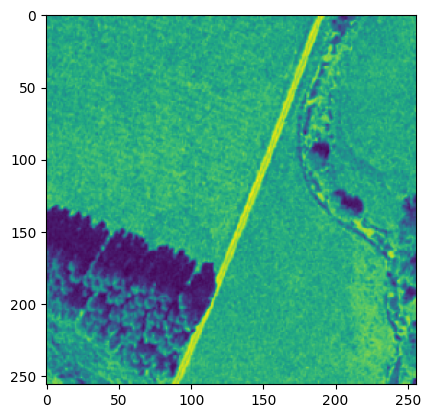

In [27]:
plt.imshow(batch_0[0][idx])

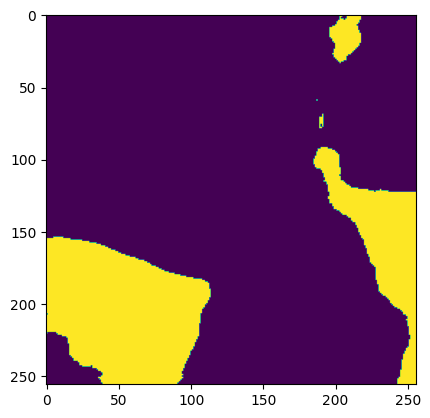

In [28]:
plt.imshow(batch_0[1][idx])

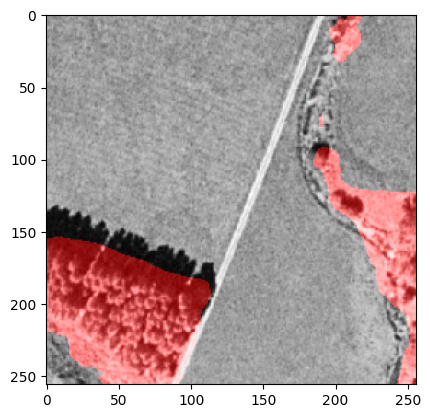

In [29]:
fig = overlay_masks(batch_0[0][idx], batch_0[1][idx], colors=[(1, 0, 0)])
plt.imshow(fig)

In [59]:
batch = 4
idx = 0
batch_0 = val_gen.__getitem__(batch)
print(val_input_img_paths[batch_size*batch:batch_size*(batch+1)][idx])

vignettes/rgb_older/rgb_1993\rgb_1993_310_6780\rgb_1993_35_310256_6780000.jpg


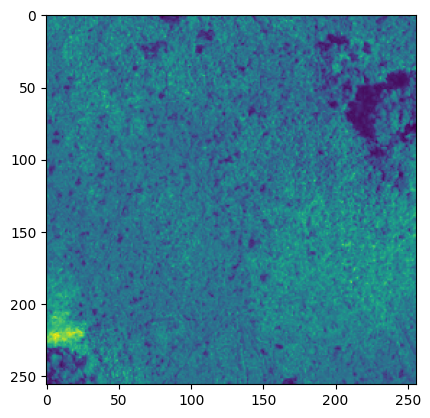

In [56]:
plt.imshow(batch_0[0][idx])

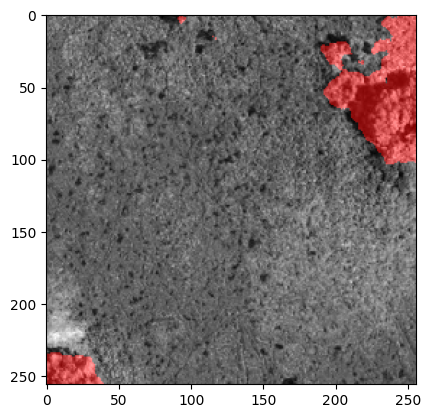

In [57]:
fig = overlay_masks(batch_0[0][idx], batch_0[1][idx], colors=[(1, 0, 0)])
plt.imshow(fig)

In [82]:
from tf_model_related import AttentionUnet# , Losses

# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()
attention_unet = AttentionUnet((config['img_size'], config['img_size']) + (1,))
model_etape_1 = attention_unet.build_attention_unet()
losses = Losses()

In [83]:
print(model_etape_1.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv1_1 (Conv2D)            (None, 256, 256, 32)         320       ['input_1[0][0]']             
                                                                                                  
 conv1_1_bn (BatchNormaliza  (None, 256, 256, 32)         128       ['conv1_1[0][0]']             
 tion)                                                                                            
                                                                                                  
 conv1_1_act (Activation)    (None, 256, 256, 32)         0         ['conv1_1_bn[0][0]']      

In [84]:
def custom_LearningRate_schedular(epoch, learning_rate=1e-3, max_epoch=epochnum, power=0.9):
    new_lr = learning_rate * tf.math.pow((1 - epoch/max_epoch), power)
    print(f"learning rate : {new_lr}")
    return new_lr

In [85]:
now = datetime.datetime.now()
now = str(now)[:19].replace('-','_').replace(' ','_').replace(':','_')

if not os.path.exists(config['models_dir']+f'35_14_61_49/{year}'):
    os.makedirs(config['models_dir']+f'35_14_61_49/{year}')
if not os.path.exists(config['models_dir']+f'35_14_61_49/{year}/{now}/'):
    os.makedirs(config['models_dir']+f'35_14_61_49/{year}/{now}/')

In [86]:
callbacks = [
    PerformancePlotCallback(val_gen, batch=4),
    keras.callbacks.LearningRateScheduler(custom_LearningRate_schedular),
    SaveCheckpointAtEpoch(config['models_dir']+f"35_14_61_49/{year}/{now}/", 
                          f"checkpoint_AttentionUnet_{int(len(train_input_img_paths))}" + \
                          f"_trains_9_10_2020_1_10_1993_img_2020_2001_masks_STplusplus_" + \
                          f"{shrinking_mode}_shrinked_{shrinking_structure_size}_" +
                          f"{epochnum}_epochs_schedular_epoch1" \
                          .replace('.', '_').replace('-','_') + ".h5",
                          [epochnum//3, epochnum*2//3, epochnum]),
    keras.callbacks.ModelCheckpoint(config['models_dir']+f"35_14_61_49/{year}/{now}/best_intermediary_AttentionUnet_{int(len(train_input_img_paths))}_trains_9_10_2020_1_10_1993_img_2020_2001_masks_STplusplus_{shrinking_mode}_shrinked_{shrinking_structure_size}_{epochnum}_epochs_schedular".replace('.', '_').replace('-','_') + ".h5", save_best_only=True)
]

In [87]:
train_gen.__getitem__(0)[0].shape

(32, 256, 256, 1)

learning rate : 0.0010000000474974513
Epoch 1/20
1/1 [==============================] - 1s 1s/step- loss: 0.1279 - binary_accuracy: 0.8201 - io_u: 0.46


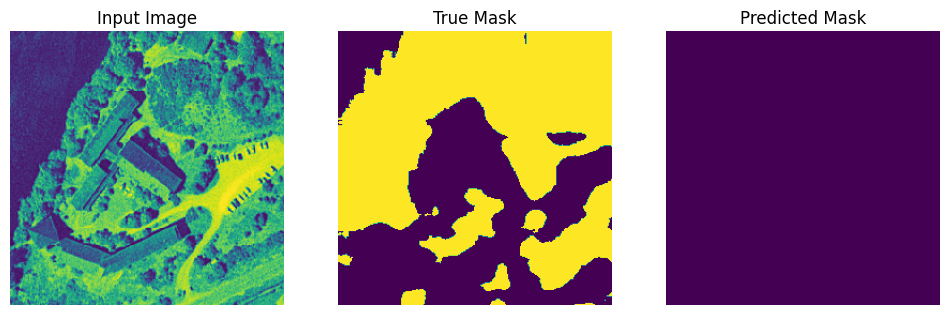


Sample Prediction after epoch 1

78/78 [==============================] - 258s 3s/step - loss: 0.1279 - binary_accuracy: 0.8201 - io_u: 0.4671 - val_loss: 0.9731 - val_binary_accuracy: 0.6998 - val_io_u: 0.0000e+00 - lr: 0.0010
learning rate : 0.0009548853849992156
Epoch 2/20
1/1 [==============================] - 1s 798ms/steposs: 0.0812 - binary_accuracy: 0.8720 - io_u: 0.65


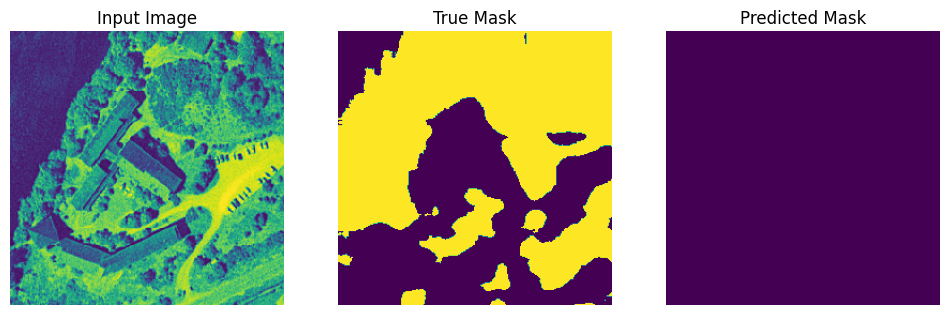


Sample Prediction after epoch 2

78/78 [==============================] - 244s 3s/step - loss: 0.0812 - binary_accuracy: 0.8720 - io_u: 0.6547 - val_loss: 0.9992 - val_binary_accuracy: 0.6998 - val_io_u: 0.0000e+00 - lr: 9.5489e-04
learning rate : 0.0008684993372298777
Epoch 3/20
1/1 [==============================] - 1s 792ms/steposs: 0.0689 - binary_accuracy: 0.8879 - io_u: 0.68


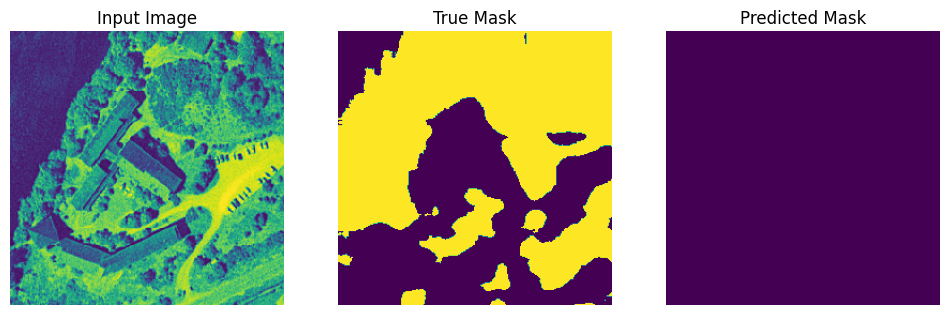


Sample Prediction after epoch 3

78/78 [==============================] - 243s 3s/step - loss: 0.0689 - binary_accuracy: 0.8879 - io_u: 0.6834 - val_loss: 1.0000 - val_binary_accuracy: 0.6998 - val_io_u: 0.0000e+00 - lr: 8.6850e-04
learning rate : 0.0007503200322389603
Epoch 4/20
1/1 [==============================] - 1s 805ms/steposs: 0.0578 - binary_accuracy: 0.9052 - io_u: 0.71


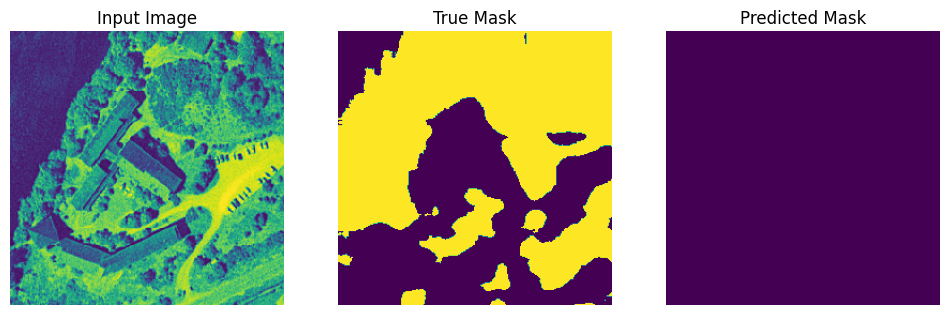


Sample Prediction after epoch 4

78/78 [==============================] - 243s 3s/step - loss: 0.0578 - binary_accuracy: 0.9052 - io_u: 0.7136 - val_loss: 0.9999 - val_binary_accuracy: 0.6998 - val_io_u: 0.0000e+00 - lr: 7.5032e-04
learning rate : 0.0006138009484857321
Epoch 5/20
1/1 [==============================] - 1s 769ms/steposs: 0.0528 - binary_accuracy: 0.9120 - io_u: 0.72


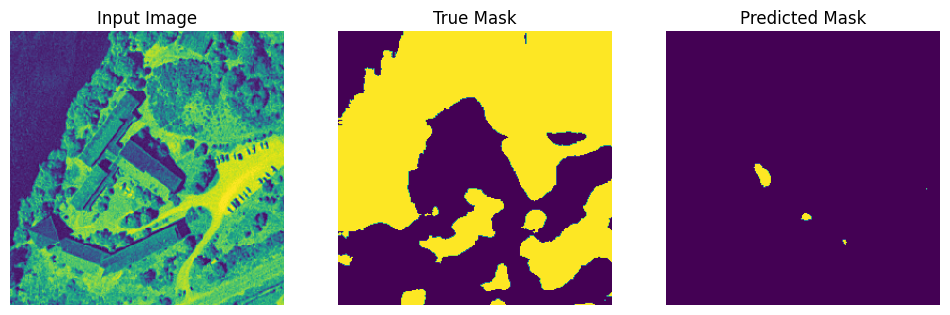


Sample Prediction after epoch 5

78/78 [==============================] - 245s 3s/step - loss: 0.0528 - binary_accuracy: 0.9120 - io_u: 0.7286 - val_loss: 0.9993 - val_binary_accuracy: 0.6998 - val_io_u: 3.9704e-06 - lr: 6.1380e-04
learning rate : 0.00047378652379848063
Epoch 6/20
1/1 [==============================] - 1s 733ms/steposs: 0.0459 - binary_accuracy: 0.9214 - io_u: 0.74


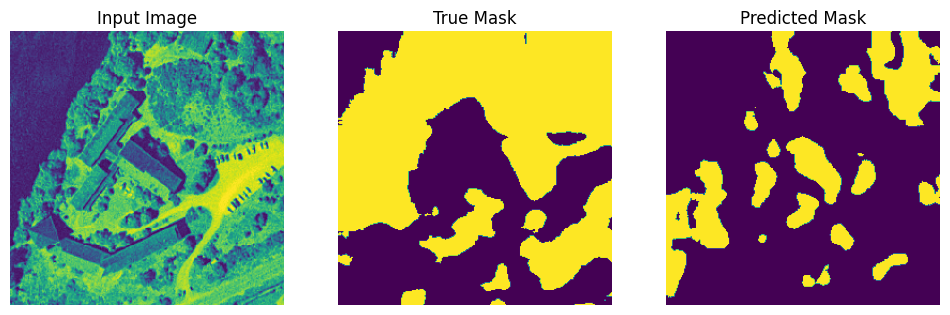


Sample Prediction after epoch 6


            Model checkpoint saved at epoch 6.
            
78/78 [==============================] - 245s 3s/step - loss: 0.0459 - binary_accuracy: 0.9214 - io_u: 0.7446 - val_loss: 0.9082 - val_binary_accuracy: 0.7117 - val_io_u: 0.0195 - lr: 4.7379e-04
learning rate : 0.00034369321656413376
Epoch 7/20
1/1 [==============================] - 1s 755ms/steposs: 0.0428 - binary_accuracy: 0.9253 - io_u: 0.75


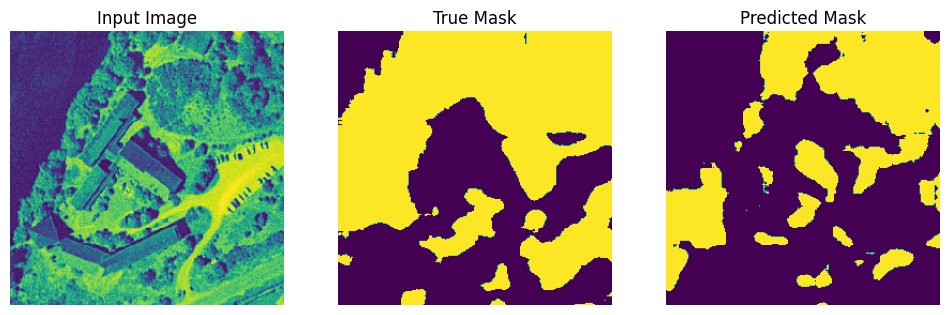


Sample Prediction after epoch 7

78/78 [==============================] - 244s 3s/step - loss: 0.0428 - binary_accuracy: 0.9253 - io_u: 0.7581 - val_loss: 0.6949 - val_binary_accuracy: 0.7394 - val_io_u: 0.0875 - lr: 3.4369e-04
learning rate : 0.0002332346048206091
Epoch 8/20
1/1 [==============================] - 1s 762ms/steposs: 0.0405 - binary_accuracy: 0.9292 - io_u: 0.76


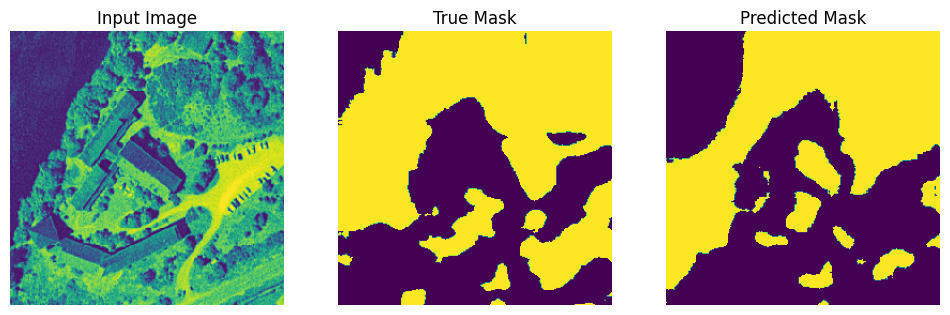


Sample Prediction after epoch 8

78/78 [==============================] - 263s 3s/step - loss: 0.0405 - binary_accuracy: 0.9292 - io_u: 0.7674 - val_loss: 0.1294 - val_binary_accuracy: 0.8934 - val_io_u: 0.5737 - lr: 2.3323e-04
learning rate : 0.00014727503003086895
Epoch 9/20
1/1 [==============================] - 1s 799ms/steposs: 0.0382 - binary_accuracy: 0.9339 - io_u: 0.76


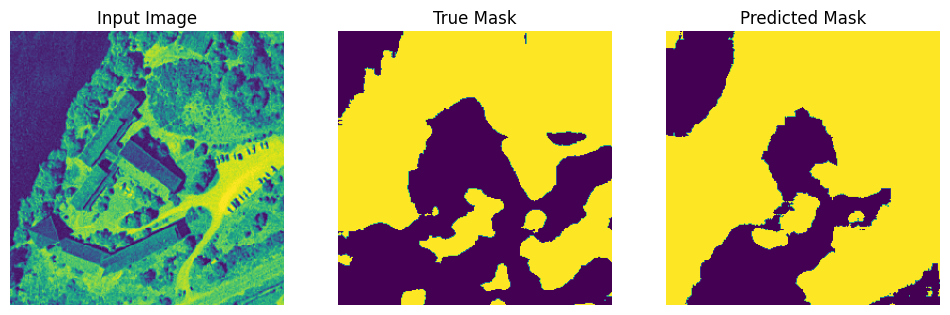


Sample Prediction after epoch 9

78/78 [==============================] - 244s 3s/step - loss: 0.0382 - binary_accuracy: 0.9339 - io_u: 0.7670 - val_loss: 0.0446 - val_binary_accuracy: 0.9360 - val_io_u: 0.7239 - lr: 1.4728e-04
learning rate : 8.59915089677088e-05
Epoch 10/20
1/1 [==============================] - 1s 733ms/steposs: 0.0363 - binary_accuracy: 0.9365 - io_u: 0.77


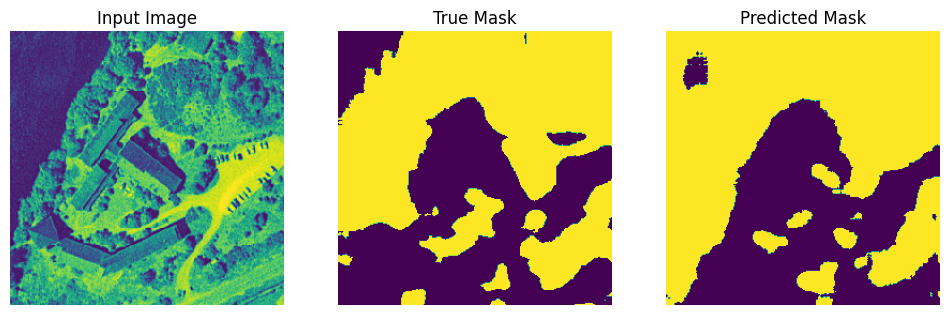


Sample Prediction after epoch 10

78/78 [==============================] - 243s 3s/step - loss: 0.0363 - binary_accuracy: 0.9365 - io_u: 0.7782 - val_loss: 0.0339 - val_binary_accuracy: 0.9401 - val_io_u: 0.7499 - lr: 8.5992e-05
learning rate : 4.608171002473682e-05
Epoch 11/20
1/1 [==============================] - 1s 784ms/steposs: 0.0350 - binary_accuracy: 0.9382 - io_u: 0.78


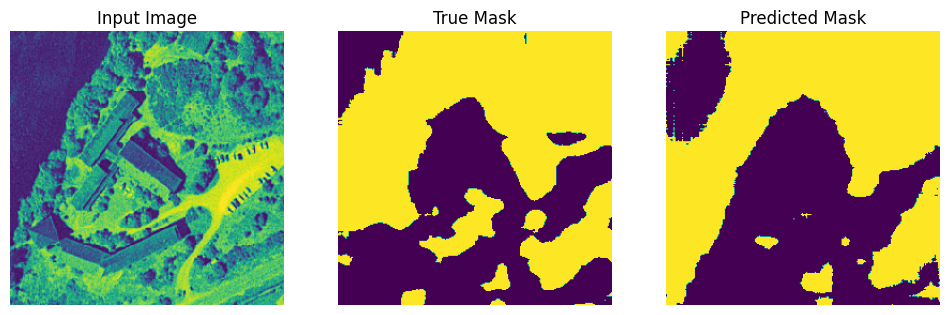


Sample Prediction after epoch 11

78/78 [==============================] - 243s 3s/step - loss: 0.0350 - binary_accuracy: 0.9382 - io_u: 0.7849 - val_loss: 0.0545 - val_binary_accuracy: 0.9316 - val_io_u: 0.6643 - lr: 4.6082e-05
learning rate : 2.2460520995082334e-05
Epoch 12/20
1/1 [==============================] - 1s 734ms/steposs: 0.0344 - binary_accuracy: 0.9393 - io_u: 0.78


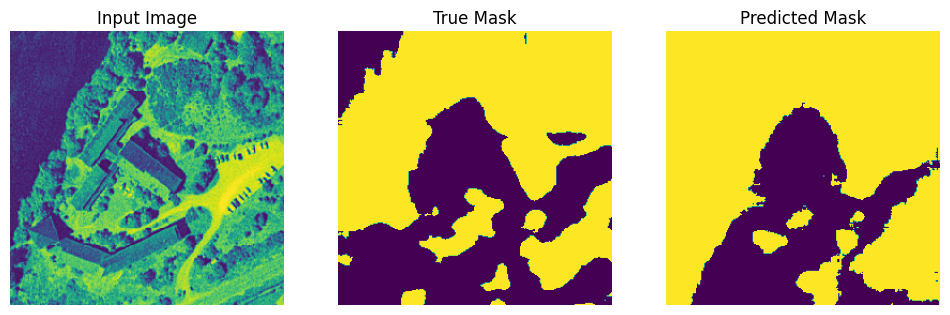


Sample Prediction after epoch 12

78/78 [==============================] - 261s 3s/step - loss: 0.0344 - binary_accuracy: 0.9393 - io_u: 0.7863 - val_loss: 0.0312 - val_binary_accuracy: 0.9394 - val_io_u: 0.7909 - lr: 2.2461e-05
learning rate : 9.846317880146671e-06
Epoch 13/20
1/1 [==============================] - 1s 775ms/steposs: 0.0338 - binary_accuracy: 0.9400 - io_u: 0.78


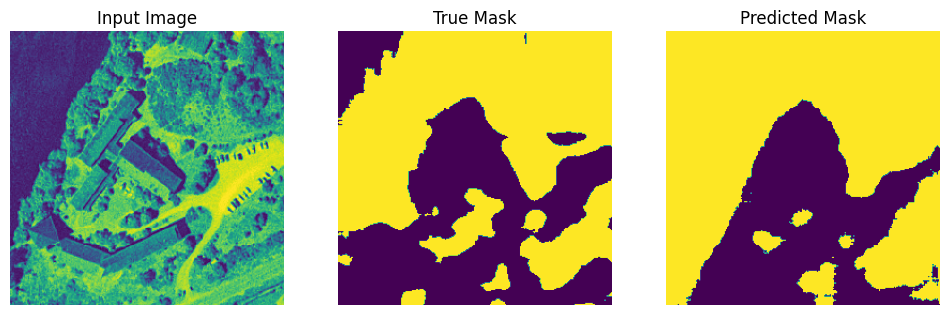


Sample Prediction after epoch 13


            Model checkpoint saved at epoch 13.
            
78/78 [==============================] - 244s 3s/step - loss: 0.0338 - binary_accuracy: 0.9400 - io_u: 0.7870 - val_loss: 0.0309 - val_binary_accuracy: 0.9399 - val_io_u: 0.7954 - lr: 9.8463e-06
learning rate : 3.827675300271949e-06
Epoch 14/20
1/1 [==============================] - 1s 1s/step- loss: 0.0336 - binary_accuracy: 0.9406 - io_u: 0.78


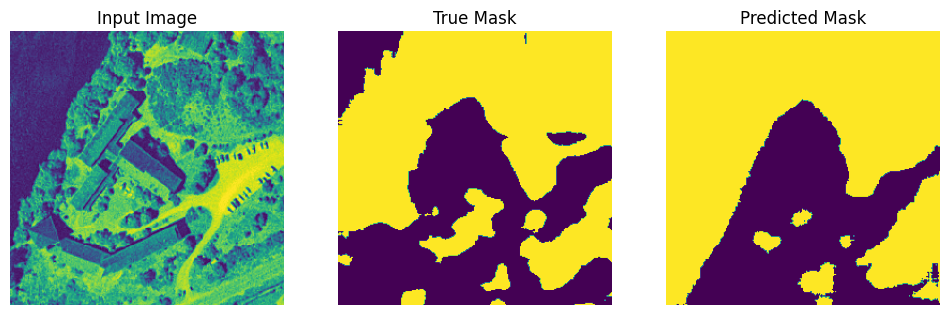


Sample Prediction after epoch 14

78/78 [==============================] - 271s 3s/step - loss: 0.0336 - binary_accuracy: 0.9406 - io_u: 0.7875 - val_loss: 0.0309 - val_binary_accuracy: 0.9400 - val_io_u: 0.7971 - lr: 3.8277e-06
learning rate : 1.2952222050444107e-06
Epoch 15/20
1/1 [==============================] - 1s 766ms/steposs: 0.0336 - binary_accuracy: 0.9408 - io_u: 0.78


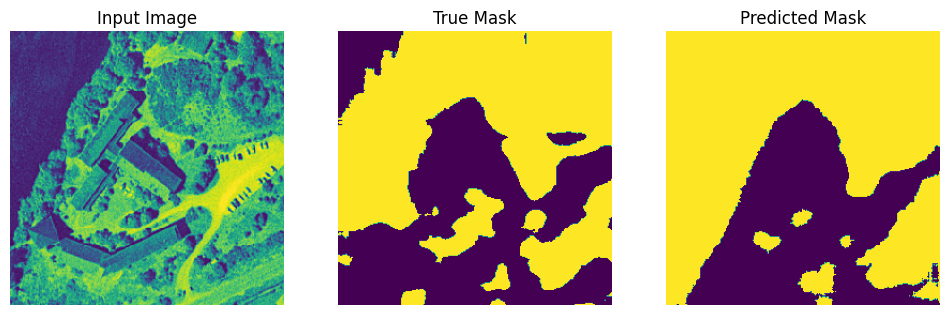


Sample Prediction after epoch 15

78/78 [==============================] - 276s 4s/step - loss: 0.0336 - binary_accuracy: 0.9408 - io_u: 0.7873 - val_loss: 0.0310 - val_binary_accuracy: 0.9397 - val_io_u: 0.7987 - lr: 1.2952e-06
learning rate : 3.719549397374067e-07
Epoch 16/20
1/1 [==============================] - 1s 783ms/steposs: 0.0335 - binary_accuracy: 0.9408 - io_u: 0.78


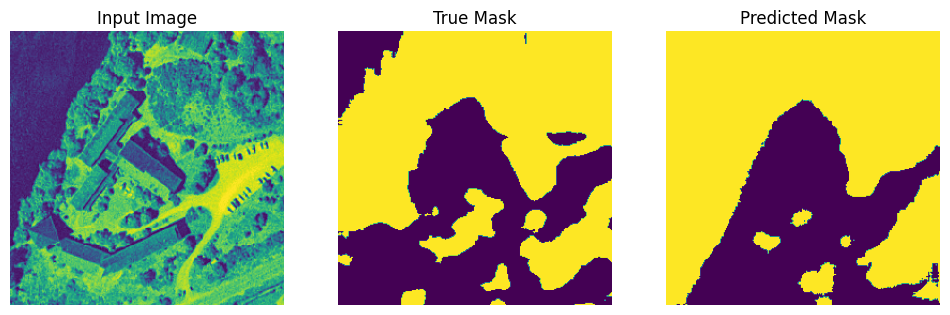


Sample Prediction after epoch 16

78/78 [==============================] - 251s 3s/step - loss: 0.0335 - binary_accuracy: 0.9408 - io_u: 0.7875 - val_loss: 0.0309 - val_binary_accuracy: 0.9400 - val_io_u: 0.7986 - lr: 3.7195e-07
learning rate : 8.738106771488674e-08
Epoch 17/20
1/1 [==============================] - 1s 787ms/steposs: 0.0335 - binary_accuracy: 0.9408 - io_u: 0.78


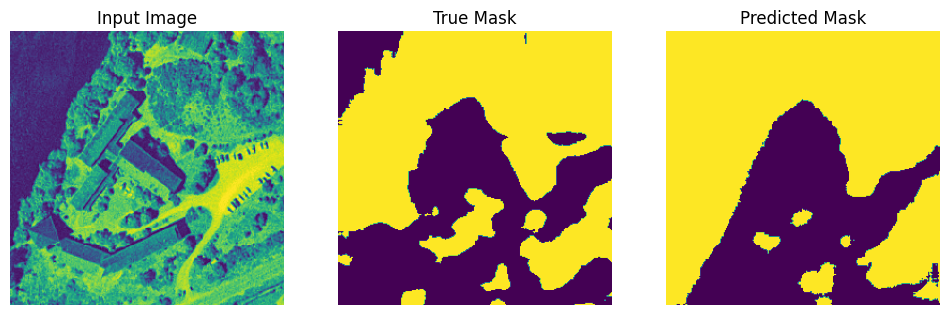


Sample Prediction after epoch 17

78/78 [==============================] - 248s 3s/step - loss: 0.0335 - binary_accuracy: 0.9408 - io_u: 0.7875 - val_loss: 0.0310 - val_binary_accuracy: 0.9398 - val_io_u: 0.7993 - lr: 8.7381e-08
learning rate : 1.584526643227946e-08
Epoch 18/20
1/1 [==============================] - 1s 822ms/steposs: 0.0335 - binary_accuracy: 0.9408 - io_u: 0.78


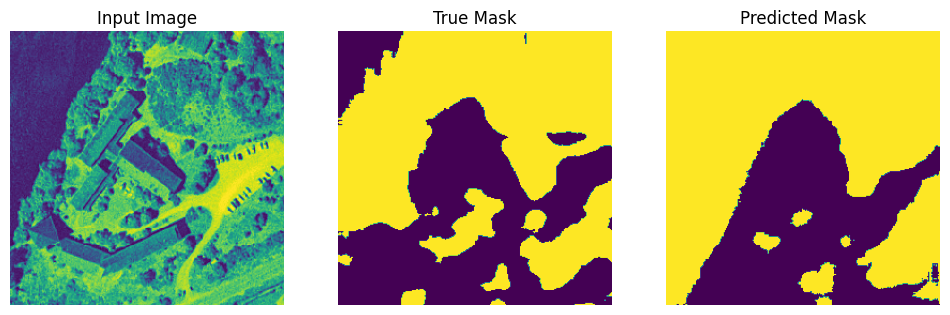


Sample Prediction after epoch 18

78/78 [==============================] - 249s 3s/step - loss: 0.0335 - binary_accuracy: 0.9408 - io_u: 0.7875 - val_loss: 0.0309 - val_binary_accuracy: 0.9399 - val_io_u: 0.7991 - lr: 1.5845e-08
learning rate : 1.9948009910564224e-09
Epoch 19/20
1/1 [==============================] - 1s 803ms/steposs: 0.0335 - binary_accuracy: 0.9408 - io_u: 0.78


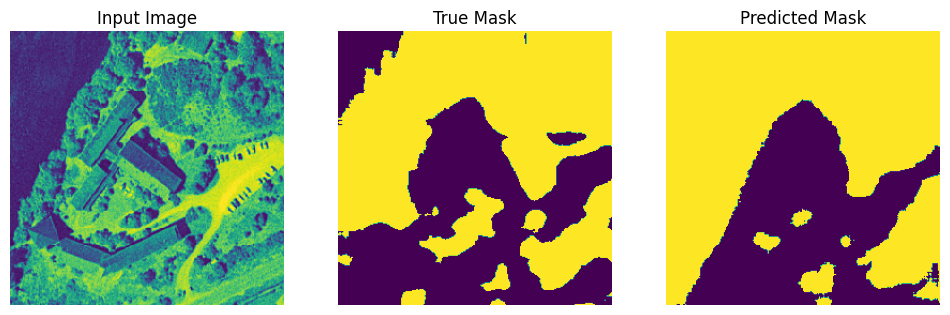


Sample Prediction after epoch 19

78/78 [==============================] - 250s 3s/step - loss: 0.0335 - binary_accuracy: 0.9408 - io_u: 0.7875 - val_loss: 0.0309 - val_binary_accuracy: 0.9400 - val_io_u: 0.7993 - lr: 1.9948e-09
learning rate : 1.345775574312924e-10
Epoch 20/20
1/1 [==============================] - 1s 786ms/steposs: 0.0335 - binary_accuracy: 0.9408 - io_u: 0.78


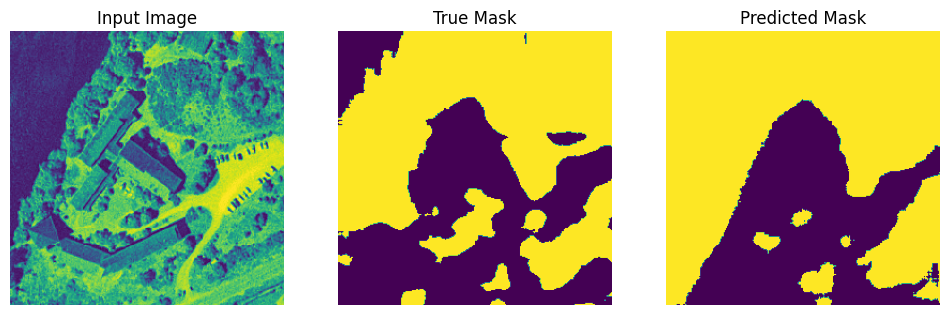


Sample Prediction after epoch 20


            Model checkpoint saved at epoch 20.
            
78/78 [==============================] - 256s 3s/step - loss: 0.0335 - binary_accuracy: 0.9408 - io_u: 0.7875 - val_loss: 0.0309 - val_binary_accuracy: 0.9399 - val_io_u: 0.7993 - lr: 1.3458e-10


In [88]:
LR = 1e-3
model_etape_1.compile(optimizer=keras.optimizers.Adam(learning_rate=LR), loss=losses.focal_tversky, metrics=[keras.metrics.BinaryAccuracy(), keras.metrics.IoU(num_classes=2, target_class_ids=[1])])

hist = model_etape_1.fit(train_gen, epochs=epochnum, validation_data=val_gen, callbacks=callbacks)

In [89]:
base_fname = f"checkpoint_AttentionUnet_{int(len(train_input_img_paths))}" + \
f"_trains_9_10_2020_1_10_1993_img_2020_2001_masks_STplusplus_" + \
f"{shrinking_mode}_shrinked_{shrinking_structure_size}_" + \
f"{epochnum}_epochs_schedular_" \
.replace('.', '_').replace('-','_')

model_1_path = config['models_dir']+f"35_14_61_49/{year}/{now}/" + base_fname + str(epochnum // 3) + ".h5"
model_2_path = config['models_dir']+f"35_14_61_49/{year}/{now}/" + base_fname + str(epochnum *2 // 3) + ".h5"# "output_models/35_14_61_49/2006/2024_02_07_13_59_35/checkpoint_AttentionUnet_2250_trains_3_7_2020_2_7_2006_2_7_2006_img_2020_2012_2006_masks_STplusplus_augmented_None_shrinked_4_20_epochs_schedular_6.h5"
model_3_path = config['models_dir']+f"35_14_61_49/{year}/{now}/" + base_fname + str(epochnum) + ".h5"
model_1 = load_custom_model(model_path=model_1_path, custom_objects_list=custom_objects_list)
model_2 = load_custom_model(model_path=model_2_path, custom_objects_list=custom_objects_list)
model_3 = load_custom_model(model_path=model_3_path, custom_objects_list=custom_objects_list)

In [90]:
new_vignettes_paths = sorted(list(
            itertools.chain.from_iterable(
                [glob(i + "*.jpg") for i in glob(f"vignettes/rgb_older/rgb_{year}/*/", recursive=True)]
                )
))


In [115]:
def select_reliable(models, vignettes_to_test_paths, folder_name, year):
    """
    Selects reliable and unreliable IDs based on model predictions.

    Args:
        models (list): List of TensorFlow models.
        dataloader (keras.utils.Sequence): Dataset containing images, masks.
        corresponding_suffled_list_of_paths (list): list containing the paths of the imgs in dataloader
        folder_name (str): name of the folder that will store the reliability files
        year (int): year of the pictures
    Returns:
        None
    """
    
    # Create directory if it doesn't exist
    if not os.path.exists('reliable_img_path/'):
        os.makedirs('reliable_img_path/')
    if not os.path.exists(f'reliable_img_path/{str(year)}/'):
        os.makedirs(f'reliable_img_path/{str(year)}/')
    if not os.path.exists(f'reliable_img_path/{str(year)}/{folder_name}/'):
        os.makedirs(f'reliable_img_path/{str(year)}/{folder_name}/')

    # Set all models to evaluation mode
    for model in models:
        model.trainable = False

    # Progress bar for iteration over the paths
    tbar = tqdm(vignettes_to_test_paths)
    
    # List to store ID-reliability pairs
    id_to_reliability = []
    
    # Iterate over the dataloader
    for path in tbar:
        # print(path)
        
        img = cv2.imread(path)
        if int(year) <= 1993:
            img = img[:,:,0]
        img = cv2.resize(img, (256,256), interpolation=cv2.INTER_NEAREST)
        if img.max() > 1:
            img = img/255.
        preds = []
        # Get predictions from each model in the list
        for model in models:
            preds.append(model(np.expand_dims(img, axis=0)))
            
        # Calculate Mean IoU between predictions of each pair of models
        mIOU = []
        for i in range(len(preds) - 1):
            metric = tf.keras.metrics.IoU(num_classes=2, target_class_ids=[1])
            metric.update_state(preds[i], preds[-1])
            mIOU.append(metric.result().numpy())
        # print(path, mIOU)
        # # Calculate reliability as the average Mean IoU
        reliability = sum(mIOU) / len(mIOU)
        id_to_reliability.append((path, reliability))
        
    # Sort IDs based on reliability in descending order
    id_to_reliability.sort(key=lambda elem: elem[-1], reverse=True)
    
    # Write reliable and unreliable IDs to files
    with open(os.path.join(f'reliable_img_path/{str(year)}/{folder_name}/', 'reliable_ids.txt'), 'w') as f:
        for elem in id_to_reliability[:len(id_to_reliability) // 2]:
            f.write(elem[0] + '\n')
    with open(os.path.join(f'reliable_img_path/{str(year)}/{folder_name}/', 'unreliable_ids.txt'), 'w') as f:
        for elem in id_to_reliability[len(id_to_reliability) // 2:]:
            f.write(elem[0] + '\n')

    return id_to_reliability

In [92]:
new_vignettes_paths = random.sample(new_vignettes_paths, len(new_vignettes_paths))

In [116]:
# id_to_reliability = select_reliable([model_1, model_2], vignettes_to_test_paths=new_vignettes_paths[:max_samples], folder_name=now)
id_to_reliability = select_reliable([model_1, model_2, model_3],
                                    vignettes_to_test_paths=new_vignettes_paths[:max_samples], 
                                    folder_name=now, year=1993)

100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [17:55<00:00,  2.32it/s]


In [117]:
id_to_reliability

[('vignettes/rgb_older/rgb_1993\\rgb_1993_347_6773\\rgb_1993_35_347128_6773768.jpg',
  0.9403278231620789),
 ('vignettes/rgb_older/rgb_1993\\rgb_1993_344_6761\\rgb_1993_35_344256_6761384.jpg',
  0.9401170909404755),
 ('vignettes/rgb_older/rgb_1993\\rgb_1993_347_6805\\rgb_1993_35_347256_6805640.jpg',
  0.898032933473587),
 ('vignettes/rgb_older/rgb_1993\\rgb_1993_332_6761\\rgb_1993_35_332768_6761256.jpg',
  0.8963774740695953),
 ('vignettes/rgb_older/rgb_1993\\rgb_1993_336_6791\\rgb_1993_35_336384_6791384.jpg',
  0.8779803812503815),
 ('vignettes/rgb_older/rgb_1993\\rgb_1993_351_6814\\rgb_1993_35_351512_6814640.jpg',
  0.8573018908500671),
 ('vignettes/rgb_older/rgb_1993\\rgb_1993_319_6804\\rgb_1993_35_319000_6804128.jpg',
  0.8548901975154877),
 ('vignettes/rgb_older/rgb_1993\\rgb_1993_326_6808\\rgb_1993_35_326640_6808000.jpg',
  0.8455566763877869),
 ('vignettes/rgb_older/rgb_1993\\rgb_1993_341_6792\\rgb_1993_35_341128_6792000.jpg',
  0.8442651629447937),
 ('vignettes/rgb_older/rgb_19

In [118]:
def label(model, paths_of_the_reliable_pictures, folder_name, reliable, year):
    """
    Predict labels using a TensorFlow model and save the results as PNG images.

    Args:
        model (tf.keras.Model): TensorFlow model to perform predictions.
        paths_of_the_reliable_pictures (list): list containing the paths of the reliable imgs 
        folder_name (str): name of the folder that will store the reliability files
        reliable (Bool): indicate in which subfolder the labels must be stored
        year (int): year of the pictures
    Returns:
        None
    """

    # Create directory if it doesn't exist
    if not os.path.exists('pseudo_mask_STPlusplus/'):
        os.makedirs('pseudo_mask_STPlusplus/')
    if not os.path.exists(f'pseudo_mask_STPlusplus/{str(year)}/'):
        os.makedirs(f'pseudo_mask_STPlusplus/{str(year)}/')
    if not os.path.exists(f'pseudo_mask_STPlusplus/{str(year)}/{folder_name}/'):
        os.makedirs(f'pseudo_mask_STPlusplus/{str(year)}/{folder_name}/')
    if not os.path.exists(f"pseudo_mask_STPlusplus/{str(year)}/{folder_name}/{'reliable' if reliable else 'unreliable'}/"):
        os.makedirs(f"pseudo_mask_STPlusplus/{str(year)}/{folder_name}/{'reliable' if reliable else 'unreliable'}/")
    
    with open(paths_of_the_reliable_pictures, 'r') as f:
        paths = f.read().splitlines()
    
    # Set the model to evaluation mode
    model.trainable = False
    # Progress bar for iteration over the paths
    tbar = tqdm(paths)
    
    for path in tbar:
        img = cv2.imread(path)
        if int(year) <= 1993:
            img = img[:,:,0]
        img = cv2.resize(img, (256,256), interpolation=cv2.INTER_NEAREST)
        if img.max() > 1:
            img = img/255.
        # Perform prediction
        pred = np.round(model(np.expand_dims(img, axis=0))) * 255
        # Save prediction as PNG image
        cv2.imwrite(os.path.join(f"pseudo_mask_STPlusplus/{str(year)}/{folder_name}/{'reliable' if reliable else 'unreliable'}/", 
                                 os.path.basename(path[:-4] + '.png')), 
                    pred[0])


In [119]:
best_model_path = f"output_models/35_14_61_49/{year}/{now}/best_intermediary_AttentionUnet_{int(len(train_input_img_paths))}_trains_9_10_2020_1_10_1993_img_2020_2001_masks_STplusplus_{shrinking_mode}_shrinked_{shrinking_structure_size}_{epochnum}_epochs_schedular".replace('.', '_').replace('-','_') + "_passable.h5"
# 'output_models/35_14_61_49/2020/AttentionUnet_36000_trains_epochs_30_no_noise_img_size_256_LR_0_001_BS_64_FocalTverskyLoss_96acc_8414iou.h5'
best_model_etape_1 = load_custom_model(model_path=best_model_path, custom_objects_list=custom_objects_list)

In [120]:
label(model=best_model_etape_1, 
      paths_of_the_reliable_pictures=f"reliable_img_path/{year}/{now}/reliable_ids.txt", 
      folder_name=now, reliable=True, year=1993)

100%|██████████████████████████████████████████████████████████████████████████████| 1250/1250 [02:26<00:00,  8.55it/s]


In [121]:
with open(f"reliable_img_path/{year}/{now}/reliable_ids.txt", 'r') as f:
    reliable_imgs = f.read().splitlines()

reliable_imgs.sort(key=lambda x: str(os.path.basename(x).split('.')[0]))

In [122]:
reliable_pseudo_masks = sorted(list(
            itertools.chain.from_iterable(
                [glob(i + "*.png") for i in glob(f'pseudo_mask_STPlusplus/{str(year)}/{now}/reliable/')]
                )
))

reliable_pseudo_masks.sort(key=lambda x: str(os.path.basename(x).split('.')[0]))


In [123]:
[os.path.basename(i)[:-4] for i in reliable_pseudo_masks] == [os.path.basename(i)[:-4] for i in reliable_imgs] 

True

In [124]:
img_paths_etape_2 = img_paths + reliable_imgs
mask_paths_etape_2 = mask_paths + reliable_pseudo_masks

In [125]:
train_input_img_paths_etape_2, val_input_img_paths_etape_2, train_target_img_paths_etape_2, val_target_img_paths_etape_2 = train_test_split(img_paths_etape_2, mask_paths_etape_2, test_size=test_split, shuffle=True)

In [126]:
# Instantiate data Sequences for each split
train_gen_etape_2 = AugmentedOrthosSequence(batch_size=batch_size, 
                                    input_img_paths=train_input_img_paths_etape_2, 
                                    target_img_paths=train_target_img_paths_etape_2, 
                                    rgb=False, 
                                    add_noise=False, 
                                    year=2020, 
                                    augment=augment, 
                                    shrinking_mode=shrinking_mode, 
                                    shrinking_structure_size=shrinking_structure_size)
val_gen_etape_2 = AugmentedOrthosSequence(batch_size=batch_size, 
                                  input_img_paths=val_input_img_paths_etape_2, 
                                  target_img_paths=val_target_img_paths_etape_2, 
                                  rgb=False, 
                                  add_noise=False, 
                                  year=2020,
                                  augment=False,
                                  shrinking_mode=shrinking_mode, 
                                  shrinking_structure_size=shrinking_structure_size)

In [127]:
# from tf_model_related import AttentionUnet, Losses

# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()
attention_unet = AttentionUnet((config['img_size'], config['img_size']) + (1,))
model_etape_2 = attention_unet.build_attention_unet()
losses = Losses()

learning rate : 0.0010000000474974513
Epoch 1/20
1/1 [==============================] - 1s 1s/steps - loss: 0.1188 - binary_accuracy: 0.8433 - io_u: 0.54


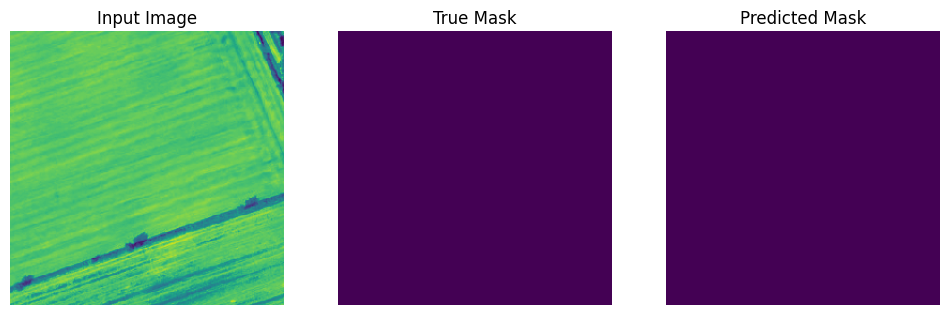


Sample Prediction after epoch 1

113/113 [==============================] - 378s 3s/step - loss: 0.1188 - binary_accuracy: 0.8433 - io_u: 0.5459 - val_loss: 0.9911 - val_binary_accuracy: 0.6787 - val_io_u: 0.0000e+00 - lr: 0.0010
learning rate : 0.0009548853849992156
Epoch 2/20
1/1 [==============================] - 1s 784ms/step loss: 0.0724 - binary_accuracy: 0.8914 - io_u: 0.69


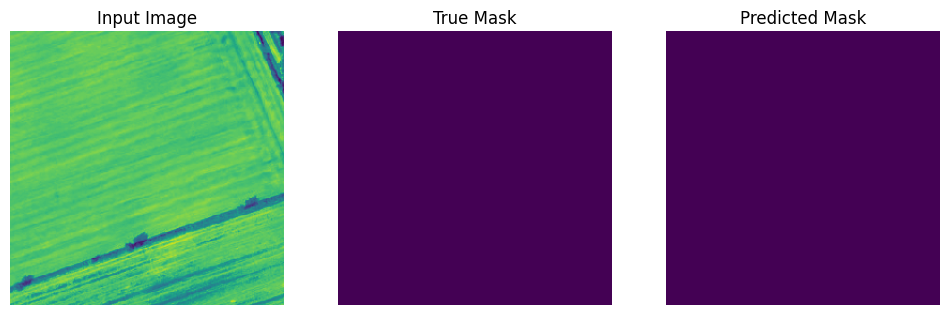


Sample Prediction after epoch 2

113/113 [==============================] - 361s 3s/step - loss: 0.0724 - binary_accuracy: 0.8914 - io_u: 0.6945 - val_loss: 0.9999 - val_binary_accuracy: 0.6787 - val_io_u: 0.0000e+00 - lr: 9.5489e-04
learning rate : 0.0008684993372298777
Epoch 3/20
1/1 [==============================] - 1s 769ms/step loss: 0.0603 - binary_accuracy: 0.9070 - io_u: 0.72


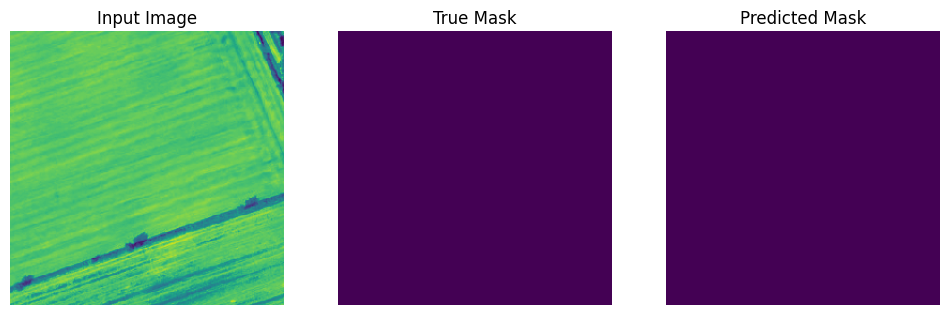


Sample Prediction after epoch 3

113/113 [==============================] - 372s 3s/step - loss: 0.0603 - binary_accuracy: 0.9070 - io_u: 0.7273 - val_loss: 0.9921 - val_binary_accuracy: 0.6796 - val_io_u: 0.0000e+00 - lr: 8.6850e-04
learning rate : 0.0007503200322389603
Epoch 4/20
1/1 [==============================] - 1s 772ms/step loss: 0.0527 - binary_accuracy: 0.9178 - io_u: 0.75


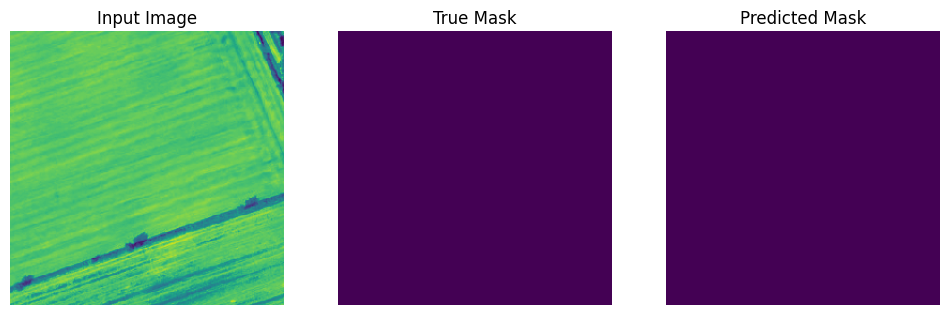


Sample Prediction after epoch 4

113/113 [==============================] - 357s 3s/step - loss: 0.0527 - binary_accuracy: 0.9178 - io_u: 0.7530 - val_loss: 0.7533 - val_binary_accuracy: 0.7209 - val_io_u: 0.0515 - lr: 7.5032e-04
learning rate : 0.0006138009484857321
Epoch 5/20
1/1 [==============================] - 1s 769ms/step loss: 0.0474 - binary_accuracy: 0.9248 - io_u: 0.77


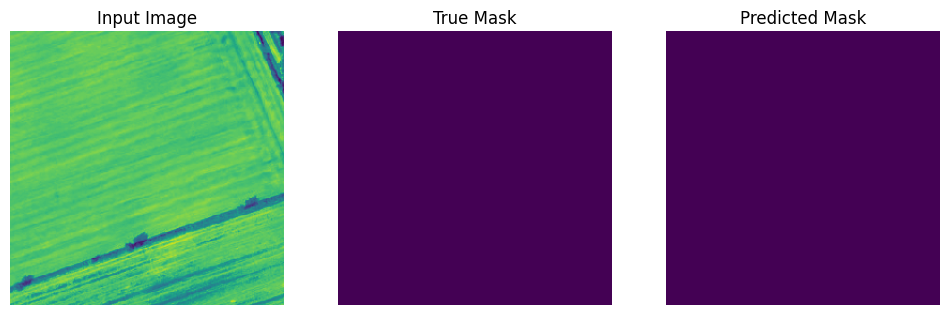


Sample Prediction after epoch 5

113/113 [==============================] - 358s 3s/step - loss: 0.0474 - binary_accuracy: 0.9248 - io_u: 0.7704 - val_loss: 0.4992 - val_binary_accuracy: 0.7718 - val_io_u: 0.2296 - lr: 6.1380e-04
learning rate : 0.00047378652379848063
Epoch 6/20
1/1 [==============================] - 1s 768ms/step loss: 0.0410 - binary_accuracy: 0.9330 - io_u: 0.78


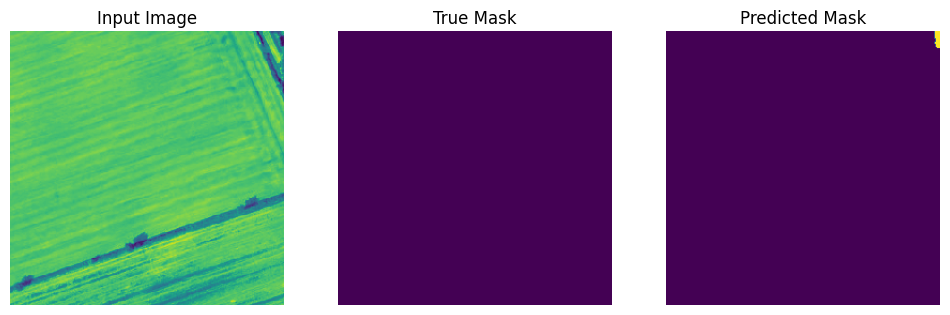


Sample Prediction after epoch 6


            Model checkpoint saved at epoch 6.
            
113/113 [==============================] - 359s 3s/step - loss: 0.0410 - binary_accuracy: 0.9330 - io_u: 0.7875 - val_loss: 0.0849 - val_binary_accuracy: 0.9118 - val_io_u: 0.6645 - lr: 4.7379e-04
learning rate : 0.00034369321656413376
Epoch 7/20
1/1 [==============================] - 1s 785ms/step loss: 0.0393 - binary_accuracy: 0.9351 - io_u: 0.79


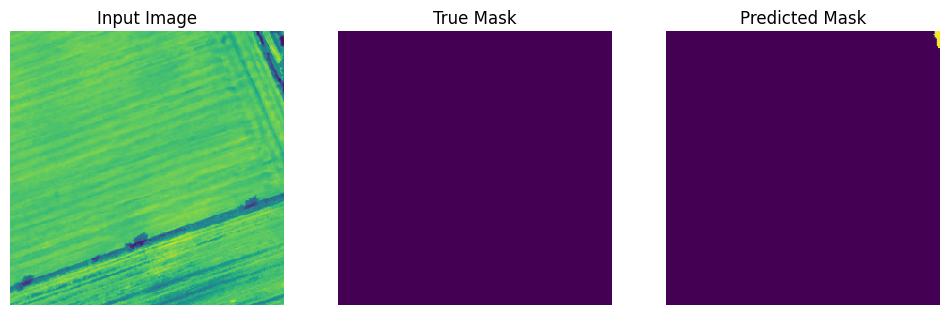


Sample Prediction after epoch 7

113/113 [==============================] - 360s 3s/step - loss: 0.0393 - binary_accuracy: 0.9351 - io_u: 0.7936 - val_loss: 0.0336 - val_binary_accuracy: 0.9394 - val_io_u: 0.7941 - lr: 3.4369e-04
learning rate : 0.0002332346048206091
Epoch 8/20
1/1 [==============================] - 1s 800ms/step loss: 0.0357 - binary_accuracy: 0.9403 - io_u: 0.80


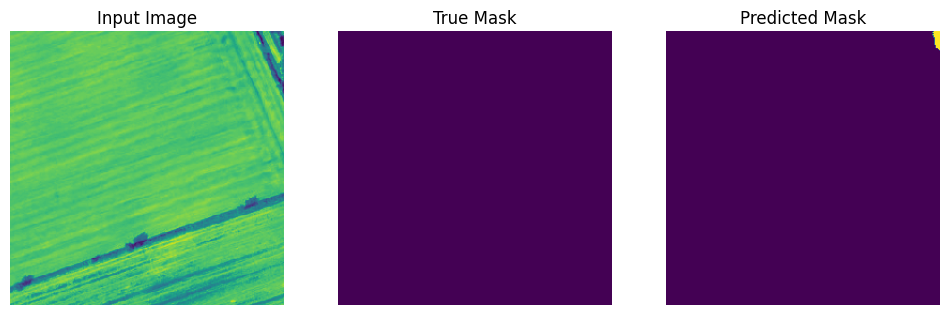


Sample Prediction after epoch 8

113/113 [==============================] - 358s 3s/step - loss: 0.0357 - binary_accuracy: 0.9403 - io_u: 0.8067 - val_loss: 0.0344 - val_binary_accuracy: 0.9423 - val_io_u: 0.8028 - lr: 2.3323e-04
learning rate : 0.00014727503003086895
Epoch 9/20
1/1 [==============================] - 1s 779ms/step loss: 0.0338 - binary_accuracy: 0.9435 - io_u: 0.81


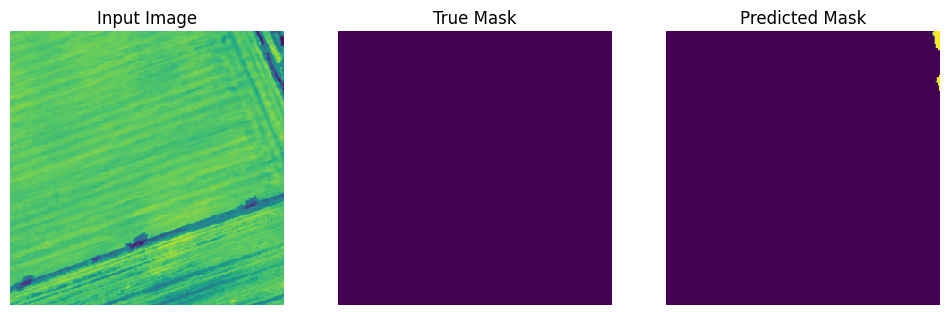


Sample Prediction after epoch 9

113/113 [==============================] - 359s 3s/step - loss: 0.0338 - binary_accuracy: 0.9435 - io_u: 0.8134 - val_loss: 0.0299 - val_binary_accuracy: 0.9425 - val_io_u: 0.8228 - lr: 1.4728e-04
learning rate : 8.59915089677088e-05
Epoch 10/20
1/1 [==============================] - 1s 779ms/step loss: 0.0324 - binary_accuracy: 0.9461 - io_u: 0.81


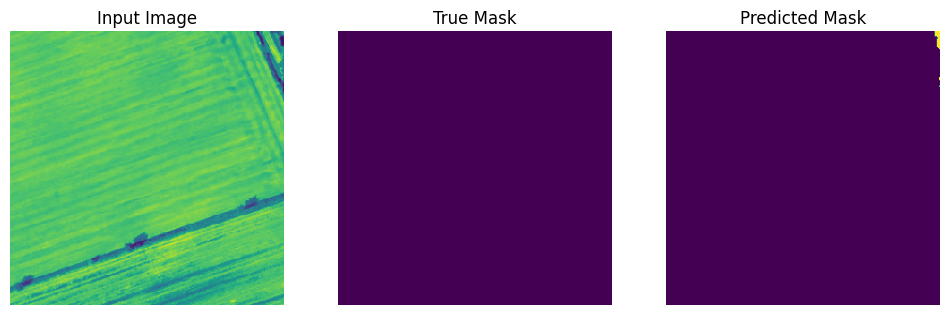


Sample Prediction after epoch 10

113/113 [==============================] - 359s 3s/step - loss: 0.0324 - binary_accuracy: 0.9461 - io_u: 0.8170 - val_loss: 0.0278 - val_binary_accuracy: 0.9477 - val_io_u: 0.8216 - lr: 8.5992e-05
learning rate : 4.608171002473682e-05
Epoch 11/20
1/1 [==============================] - 1s 794ms/step loss: 0.0312 - binary_accuracy: 0.9471 - io_u: 0.82


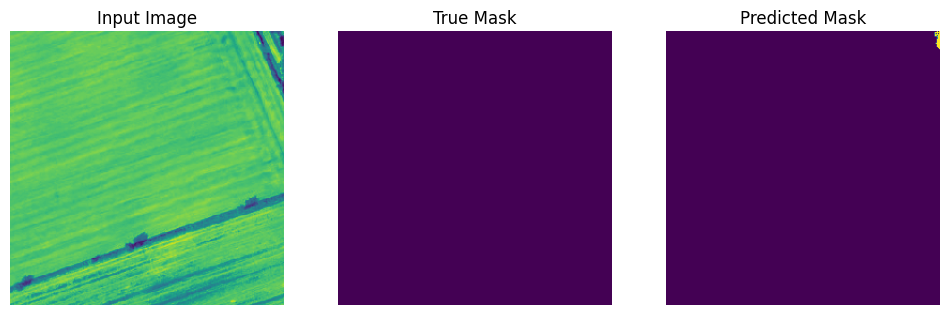


Sample Prediction after epoch 11

113/113 [==============================] - 361s 3s/step - loss: 0.0312 - binary_accuracy: 0.9471 - io_u: 0.8221 - val_loss: 0.0275 - val_binary_accuracy: 0.9484 - val_io_u: 0.8252 - lr: 4.6082e-05
learning rate : 2.2460520995082334e-05
Epoch 12/20
1/1 [==============================] - 1s 770ms/step loss: 0.0304 - binary_accuracy: 0.9491 - io_u: 0.82


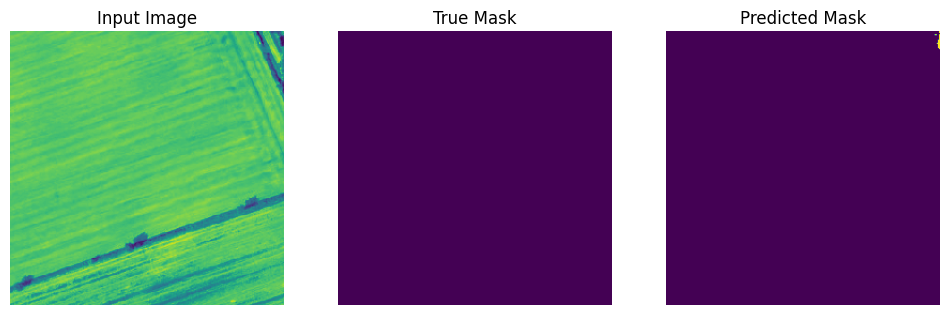


Sample Prediction after epoch 12

113/113 [==============================] - 360s 3s/step - loss: 0.0304 - binary_accuracy: 0.9491 - io_u: 0.8233 - val_loss: 0.0260 - val_binary_accuracy: 0.9490 - val_io_u: 0.8345 - lr: 2.2461e-05
learning rate : 9.846317880146671e-06
Epoch 13/20
1/1 [==============================] - 1s 763ms/step loss: 0.0297 - binary_accuracy: 0.9497 - io_u: 0.82


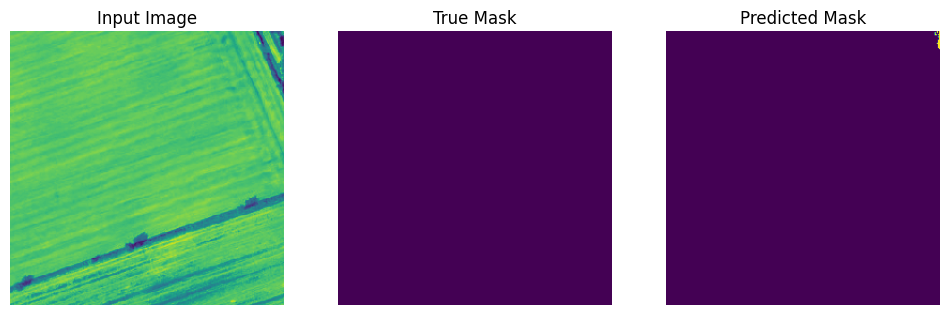


Sample Prediction after epoch 13


            Model checkpoint saved at epoch 13.
            
113/113 [==============================] - 362s 3s/step - loss: 0.0297 - binary_accuracy: 0.9497 - io_u: 0.8256 - val_loss: 0.0256 - val_binary_accuracy: 0.9490 - val_io_u: 0.8374 - lr: 9.8463e-06
learning rate : 3.827675300271949e-06
Epoch 14/20
1/1 [==============================] - 1s 758ms/step loss: 0.0295 - binary_accuracy: 0.9500 - io_u: 0.82


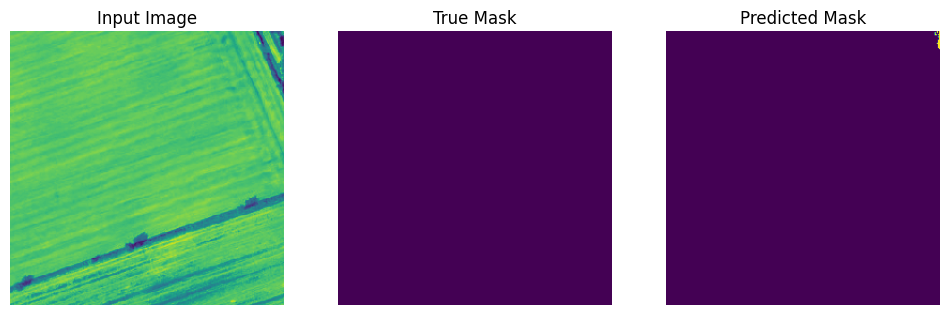


Sample Prediction after epoch 14

113/113 [==============================] - 361s 3s/step - loss: 0.0295 - binary_accuracy: 0.9500 - io_u: 0.8257 - val_loss: 0.0257 - val_binary_accuracy: 0.9481 - val_io_u: 0.8391 - lr: 3.8277e-06
learning rate : 1.2952222050444107e-06
Epoch 15/20
1/1 [==============================] - 1s 770ms/step loss: 0.0294 - binary_accuracy: 0.9503 - io_u: 0.82


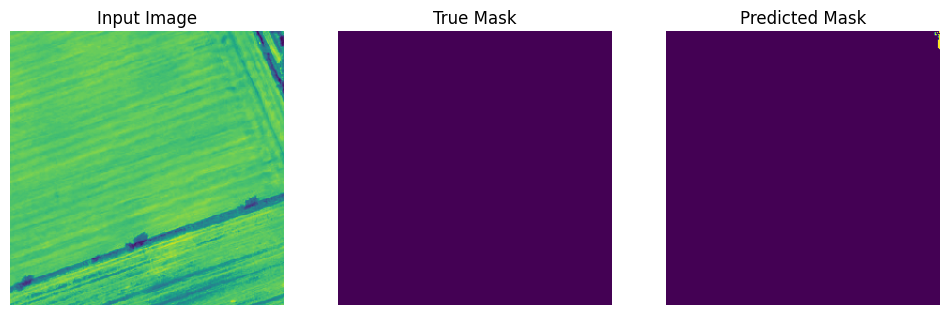


Sample Prediction after epoch 15

113/113 [==============================] - 365s 3s/step - loss: 0.0294 - binary_accuracy: 0.9503 - io_u: 0.8255 - val_loss: 0.0257 - val_binary_accuracy: 0.9482 - val_io_u: 0.8384 - lr: 1.2952e-06
learning rate : 3.719549397374067e-07
Epoch 16/20
1/1 [==============================] - 1s 753ms/step loss: 0.0294 - binary_accuracy: 0.9502 - io_u: 0.82


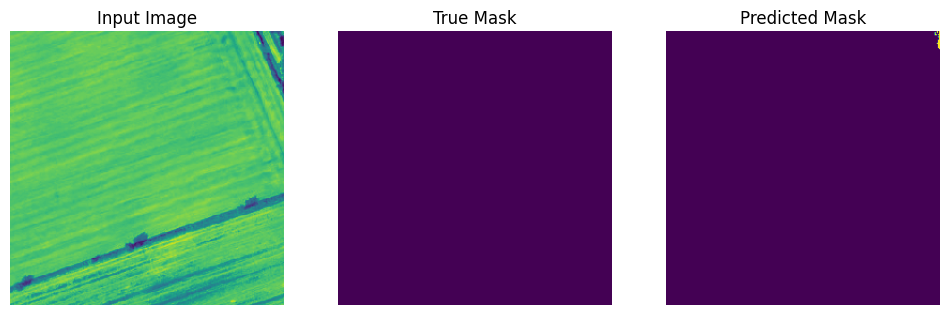


Sample Prediction after epoch 16

113/113 [==============================] - 377s 3s/step - loss: 0.0294 - binary_accuracy: 0.9502 - io_u: 0.8260 - val_loss: 0.0257 - val_binary_accuracy: 0.9480 - val_io_u: 0.8389 - lr: 3.7195e-07
learning rate : 8.738106771488674e-08
Epoch 17/20
1/1 [==============================] - 1s 753ms/step loss: 0.0294 - binary_accuracy: 0.9502 - io_u: 0.82


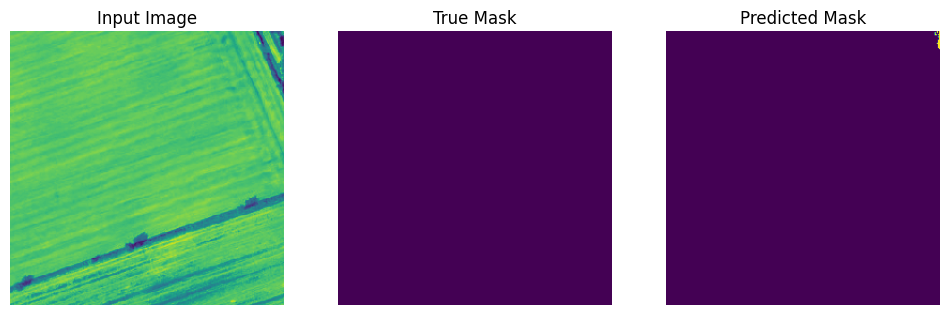


Sample Prediction after epoch 17

113/113 [==============================] - 359s 3s/step - loss: 0.0294 - binary_accuracy: 0.9502 - io_u: 0.8261 - val_loss: 0.0257 - val_binary_accuracy: 0.9480 - val_io_u: 0.8387 - lr: 8.7381e-08
learning rate : 1.584526643227946e-08
Epoch 18/20
1/1 [==============================] - 1s 768ms/step loss: 0.0294 - binary_accuracy: 0.9502 - io_u: 0.82


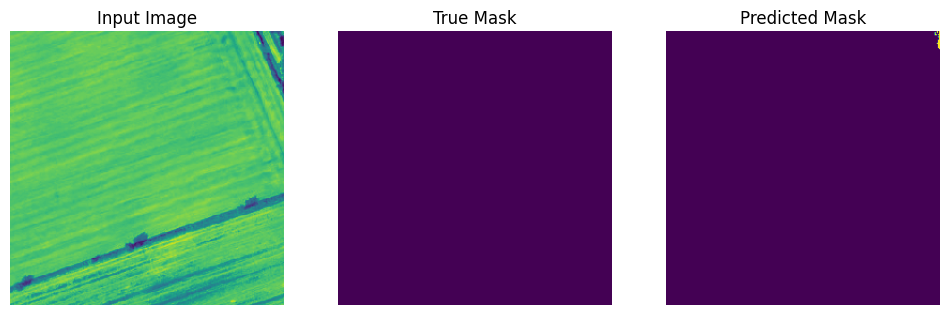


Sample Prediction after epoch 18

113/113 [==============================] - 360s 3s/step - loss: 0.0294 - binary_accuracy: 0.9502 - io_u: 0.8261 - val_loss: 0.0257 - val_binary_accuracy: 0.9481 - val_io_u: 0.8385 - lr: 1.5845e-08


In [128]:
callbacks = [
    PerformancePlotCallback(val_gen, batch=0),
    keras.callbacks.LearningRateScheduler(custom_LearningRate_schedular),
    keras.callbacks.EarlyStopping(patience=5, start_from_epoch=5),
    SaveCheckpointAtEpoch(config['models_dir']+f"35_14_61_49/{year}/{now}/", 
                          f"step_2_checkpoint_AttentionUnet_{int(len(train_input_img_paths))}" + \
                          f"_trains_9_10_2020_1_10_1993_img_2020_2001_masks_STplusplus_" + \
                          f"{shrinking_mode}_shrinked_{shrinking_structure_size}_" +
                          f"{epochnum}_epochs_schedular_epoch1" \
                          .replace('.', '_').replace('-','_') + ".h5",
                          [epochnum//3, epochnum*2//3, epochnum]),
    keras.callbacks.ModelCheckpoint(config['models_dir']+f"35_14_61_49/{year}/{now}/step_2_best_intermediary_AttentionUnet_{int(len(train_input_img_paths))}_trains_9_10_2020_1_10_1993_img_2020_2001_masks_STplusplus_{shrinking_mode}_shrinked_{shrinking_structure_size}_{epochnum}_epochs_schedular".replace('.', '_').replace('-','_') + ".h5", save_best_only=True)
]

LR = 1e-3
model_etape_2.compile(optimizer=keras.optimizers.Adam(learning_rate=LR), loss=losses.focal_tversky, metrics=[keras.metrics.BinaryAccuracy(), keras.metrics.IoU(num_classes=2, target_class_ids=[1])])

hist = model_etape_2.fit(train_gen_etape_2, epochs=epochnum, validation_data=val_gen_etape_2, callbacks=callbacks)

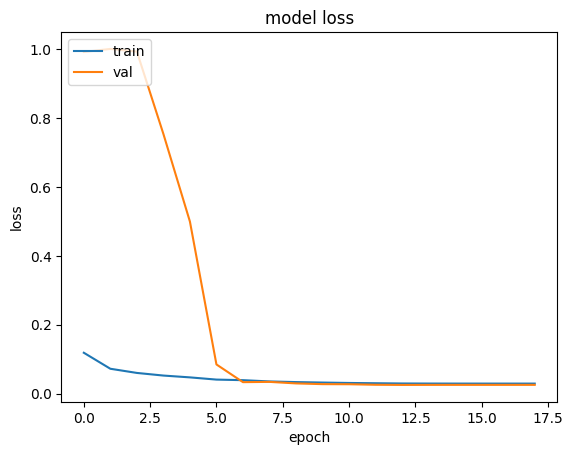

In [130]:
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

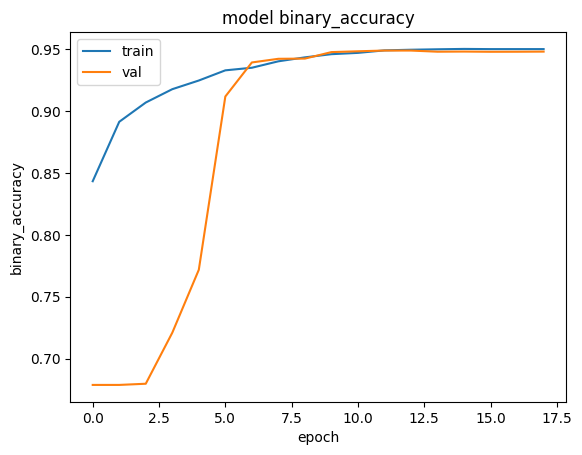

In [131]:
plt.plot(hist.history['binary_accuracy'])
plt.plot(hist.history['val_binary_accuracy'])
plt.title('model binary_accuracy')
plt.ylabel('binary_accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

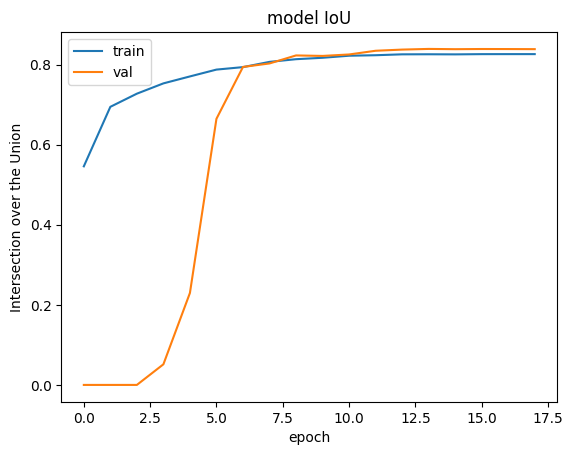

In [132]:
plt.plot(hist.history['io_u'])
plt.plot(hist.history['val_io_u'])
plt.title('model IoU')
plt.ylabel('Intersection over the Union')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [142]:
val_preds_etape_2 = model_etape_2.predict(val_gen_etape_2)

12/12 [==============================] - 10s 770ms/step


In [251]:
batch = random.randint(0, (len(val_input_img_paths_etape_2)//batch_size)-1)
idx = random.randint(0, batch_size-1)
print(idx)
print(val_input_img_paths_etape_2[batch_size*batch:batch_size*(batch+1)][idx])
# batch = random.randint(0, len(val_gen)-1)

7
vignettes/rgb_older/rgb_1993\rgb_1993_323_6802\rgb_1993_35_323384_6802768.jpg


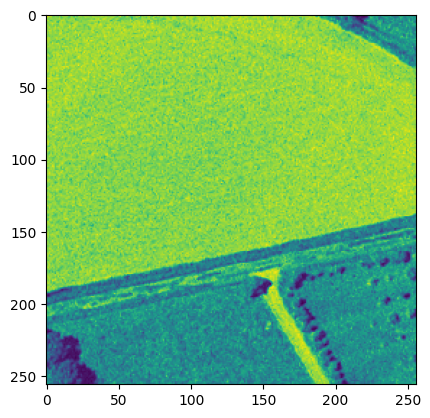

In [252]:
# ax, _ = plt.subplots(figsize=(6, 6))
plt.imshow(val_gen_etape_2.__getitem__(batch)[0][idx])

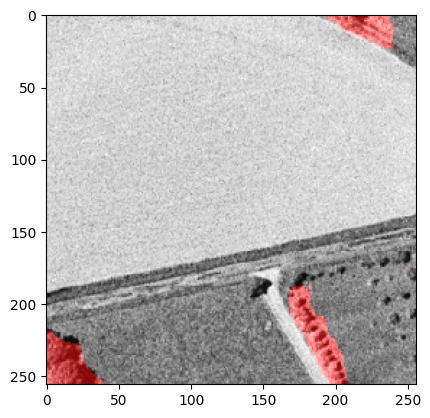

In [253]:
# ax, _ = plt.subplots(figsize=(6, 6))
fig = overlay_masks(val_gen_etape_2.__getitem__(batch)[0][idx], np.round(val_preds_etape_2[batch_size*batch:batch_size*(batch+1)][idx]), colors=[(1, 0, 0)])
plt.imshow(fig)

In [134]:
best_model_path = f"output_models/35_14_61_49/{year}/{now}/step_2_checkpoint_AttentionUnet_{int(len(train_input_img_paths))}_trains_9_10_2020_1_10_1993_img_2020_2001_masks_STplusplus_{shrinking_mode}_shrinked_{shrinking_structure_size}_{epochnum}_epochs_schedular_6_passable.h5"
# f"output_models/35_14_61_49/{year}/{now}/step_2_best_intermediary_AttentionUnet_{int(len(train_input_img_paths))}_trains_9_10_2020_1_10_1993_img_2020_2001_masks_STplusplus_{epochnum}_epochs_schedular.h5"
# 'output_models/35_14_61_49/2020/AttentionUnet_36000_trains_epochs_30_no_noise_img_size_256_LR_0_001_BS_64_FocalTverskyLoss_96acc_8414iou.h5'
best_model_etape_2 = load_custom_model(model_path=best_model_path, custom_objects_list=custom_objects_list)

In [135]:
label(best_model_etape_2, f"reliable_img_path/{year}/{now}/unreliable_ids.txt", now, False, 1993)

100%|██████████████████████████████████████████████████████████████████████████████| 1250/1250 [02:36<00:00,  7.98it/s]


In [136]:
with open(f"reliable_img_path/{year}/{now}/unreliable_ids.txt", 'r') as f:
    unreliable_imgs = f.read().splitlines()

unreliable_imgs.sort(key=lambda x: str(os.path.basename(x).split('.')[0]))

In [137]:
unreliable_pseudo_masks = sorted(list(
            itertools.chain.from_iterable(
                [glob(i + "*.png") for i in glob(f'pseudo_mask_STPlusplus/{str(year)}/{now}/unreliable/')]
                )
))

unreliable_pseudo_masks.sort(key=lambda x: str(os.path.basename(x).split('.')[0]))


In [138]:
[os.path.basename(i)[:-4] for i in unreliable_pseudo_masks] == [os.path.basename(i)[:-4] for i in unreliable_imgs] 

True

In [139]:
img_paths_etape_3 = img_paths_etape_2 + unreliable_imgs
mask_paths_etape_3 = mask_paths_etape_2 + unreliable_pseudo_masks

In [140]:
train_input_img_paths_etape_3, val_input_img_paths_etape_3, train_target_img_paths_etape_3, val_target_img_paths_etape_3 = train_test_split(img_paths_etape_3, mask_paths_etape_3, test_size=test_split, shuffle=True)

In [141]:
# Instantiate data Sequences for each split
train_gen_etape_3 = AugmentedOrthosSequence(batch_size=batch_size, 
                                    input_img_paths=train_input_img_paths_etape_3, 
                                    target_img_paths=train_target_img_paths_etape_3, 
                                    rgb=False, 
                                    add_noise=False, 
                                    year=2020, 
                                    augment=augment, 
                                    shrinking_mode=shrinking_mode, 
                                    shrinking_structure_size=shrinking_structure_size)
val_gen_etape_3 = AugmentedOrthosSequence(batch_size=batch_size, 
                                  input_img_paths=val_input_img_paths_etape_3, 
                                  target_img_paths=val_target_img_paths_etape_3, 
                                  rgb=False, 
                                  add_noise=False, 
                                  year=2020,
                                  augment=False,
                                  shrinking_mode=shrinking_mode, 
                                  shrinking_structure_size=shrinking_structure_size)

In [254]:
# from tf_model_related import AttentionUnet, Losses

# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()
attention_unet = AttentionUnet((config['img_size'], config['img_size']) + (1,))
model_etape_3 = attention_unet.build_attention_unet()
losses = Losses()

learning rate : 0.0010000000474974513
Epoch 1/20
1/1 [==============================] - 1s 1s/steps - loss: 0.1226 - binary_accuracy: 0.8289 - io_u: 0.55


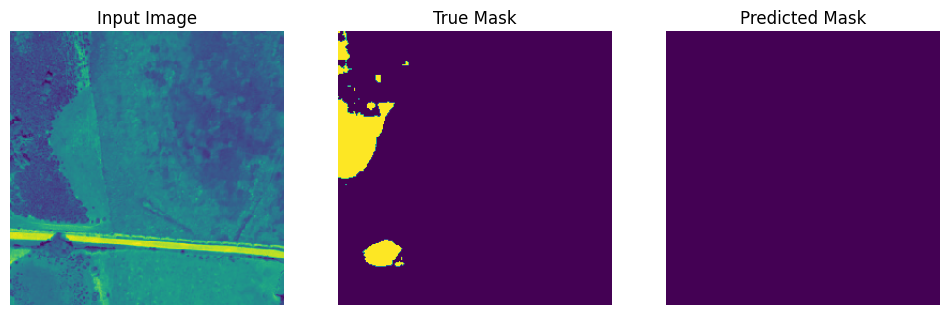


Sample Prediction after epoch 1

148/148 [==============================] - 505s 3s/step - loss: 0.1226 - binary_accuracy: 0.8289 - io_u: 0.5503 - val_loss: 0.9997 - val_binary_accuracy: 0.7443 - val_io_u: 0.0000e+00 - lr: 0.0010
learning rate : 0.0009548853849992156
Epoch 2/20
1/1 [==============================] - 1s 752ms/step loss: 0.0674 - binary_accuracy: 0.9020 - io_u: 0.71


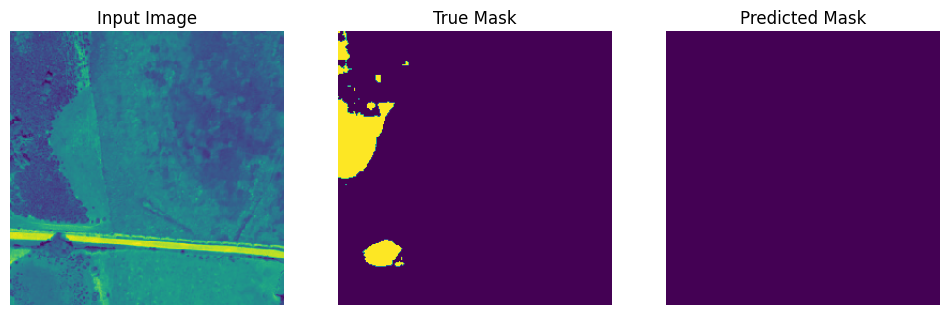


Sample Prediction after epoch 2

148/148 [==============================] - 492s 3s/step - loss: 0.0674 - binary_accuracy: 0.9020 - io_u: 0.7165 - val_loss: 1.0000 - val_binary_accuracy: 0.7443 - val_io_u: 0.0000e+00 - lr: 9.5489e-04
learning rate : 0.0008684993372298777
Epoch 3/20
1/1 [==============================] - 1s 788ms/step loss: 0.0563 - binary_accuracy: 0.9169 - io_u: 0.75


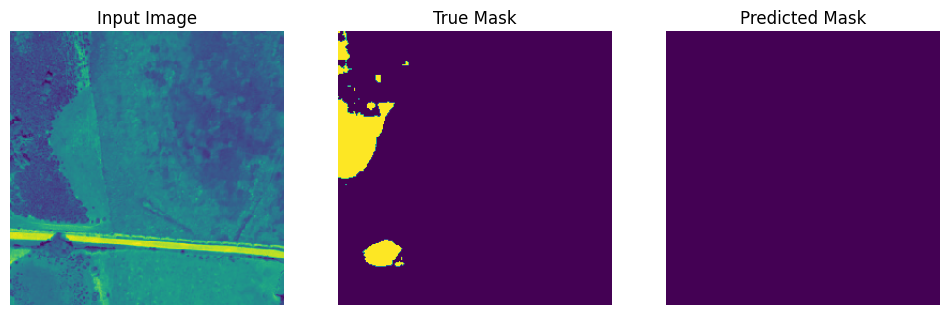


Sample Prediction after epoch 3

148/148 [==============================] - 486s 3s/step - loss: 0.0563 - binary_accuracy: 0.9169 - io_u: 0.7542 - val_loss: 0.6158 - val_binary_accuracy: 0.7926 - val_io_u: 0.1542 - lr: 8.6850e-04
learning rate : 0.0007503200322389603
Epoch 4/20
1/1 [==============================] - 1s 752ms/step loss: 0.0497 - binary_accuracy: 0.9253 - io_u: 0.77


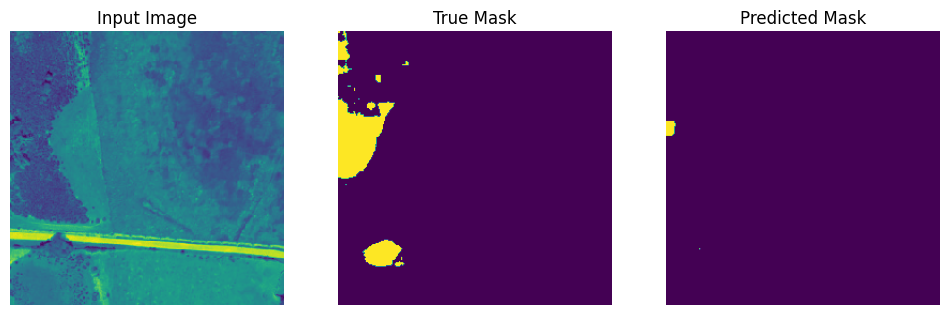


Sample Prediction after epoch 4

148/148 [==============================] - 479s 3s/step - loss: 0.0497 - binary_accuracy: 0.9253 - io_u: 0.7739 - val_loss: 0.0782 - val_binary_accuracy: 0.9153 - val_io_u: 0.7043 - lr: 7.5032e-04
learning rate : 0.0006138009484857321
Epoch 5/20
1/1 [==============================] - 1s 803ms/step loss: 0.0468 - binary_accuracy: 0.9289 - io_u: 0.78


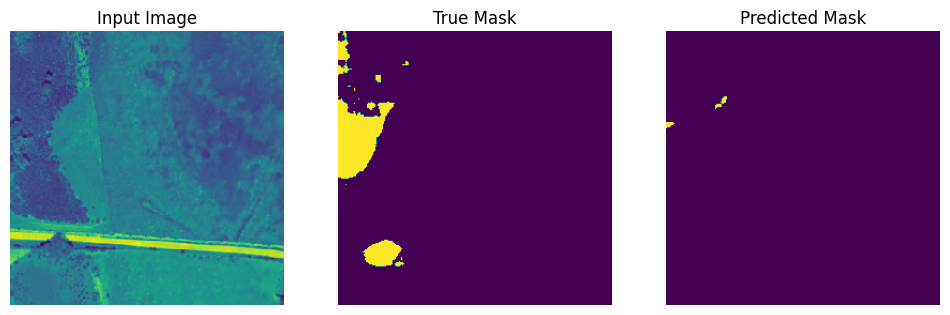


Sample Prediction after epoch 5

148/148 [==============================] - 478s 3s/step - loss: 0.0468 - binary_accuracy: 0.9289 - io_u: 0.7865 - val_loss: 0.0682 - val_binary_accuracy: 0.9332 - val_io_u: 0.7277 - lr: 6.1380e-04
learning rate : 0.00047378652379848063
Epoch 6/20
1/1 [==============================] - 1s 764ms/step loss: 0.0452 - binary_accuracy: 0.9306 - io_u: 0.79


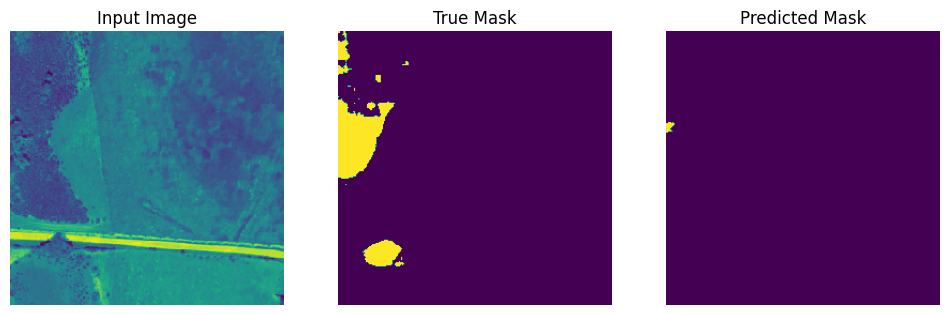


Sample Prediction after epoch 6


            Model checkpoint saved at epoch 6.
            
148/148 [==============================] - 483s 3s/step - loss: 0.0452 - binary_accuracy: 0.9306 - io_u: 0.7905 - val_loss: 0.0679 - val_binary_accuracy: 0.9341 - val_io_u: 0.7219 - lr: 4.7379e-04
learning rate : 0.00034369321656413376
Epoch 7/20
1/1 [==============================] - 1s 759ms/step loss: 0.0399 - binary_accuracy: 0.9376 - io_u: 0.80


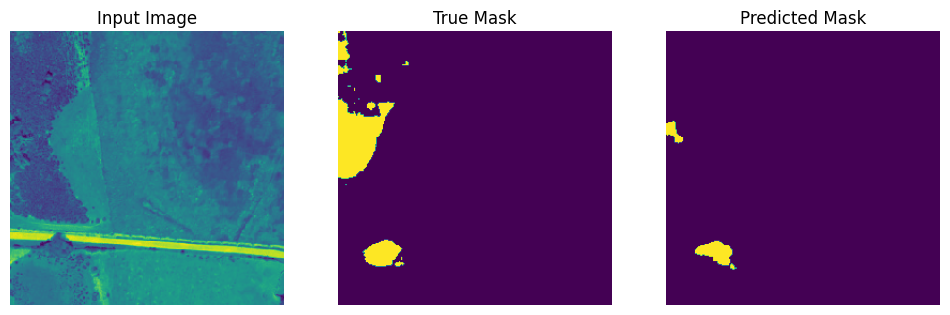


Sample Prediction after epoch 7

148/148 [==============================] - 495s 3s/step - loss: 0.0399 - binary_accuracy: 0.9376 - io_u: 0.8072 - val_loss: 0.0501 - val_binary_accuracy: 0.9159 - val_io_u: 0.7805 - lr: 3.4369e-04
learning rate : 0.0002332346048206091
Epoch 8/20
1/1 [==============================] - 1s 745ms/step loss: 0.0373 - binary_accuracy: 0.9409 - io_u: 0.81


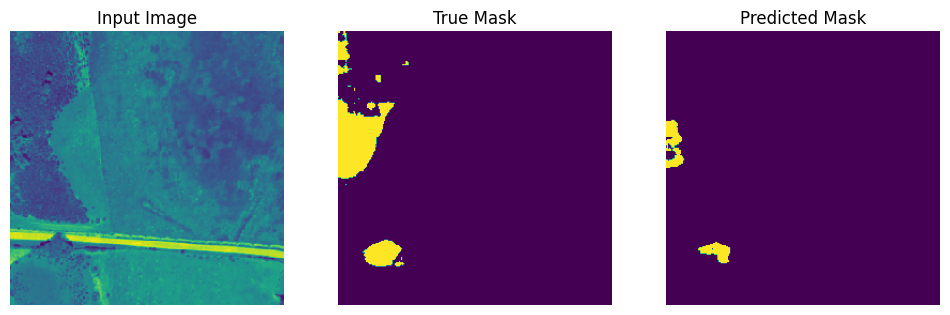


Sample Prediction after epoch 8

148/148 [==============================] - 503s 3s/step - loss: 0.0373 - binary_accuracy: 0.9409 - io_u: 0.8155 - val_loss: 0.0438 - val_binary_accuracy: 0.9272 - val_io_u: 0.7944 - lr: 2.3323e-04
learning rate : 0.00014727503003086895
Epoch 9/20
1/1 [==============================] - 1s 771ms/step loss: 0.0349 - binary_accuracy: 0.9440 - io_u: 0.82


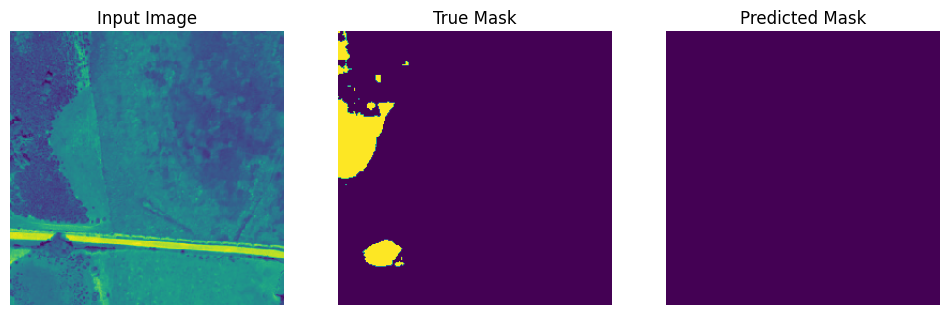


Sample Prediction after epoch 9

148/148 [==============================] - 498s 3s/step - loss: 0.0349 - binary_accuracy: 0.9440 - io_u: 0.8237 - val_loss: 0.0372 - val_binary_accuracy: 0.9464 - val_io_u: 0.8085 - lr: 1.4728e-04
learning rate : 8.59915089677088e-05
Epoch 10/20
1/1 [==============================] - 1s 772ms/step loss: 0.0340 - binary_accuracy: 0.9452 - io_u: 0.82


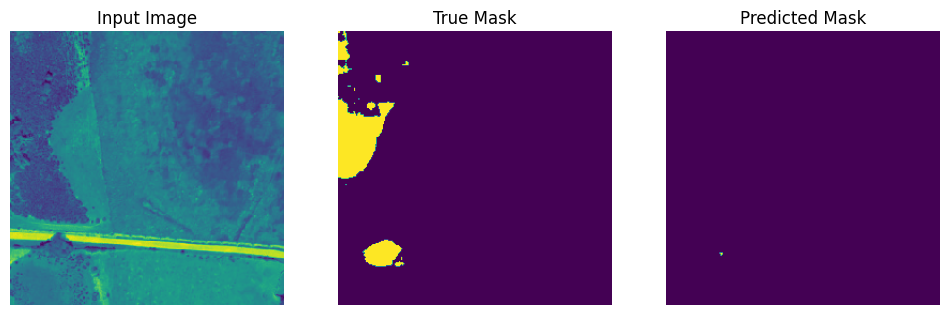


Sample Prediction after epoch 10

148/148 [==============================] - 493s 3s/step - loss: 0.0340 - binary_accuracy: 0.9452 - io_u: 0.8268 - val_loss: 0.0415 - val_binary_accuracy: 0.9501 - val_io_u: 0.7967 - lr: 8.5992e-05
learning rate : 4.608171002473682e-05
Epoch 11/20
1/1 [==============================] - 1s 753ms/step loss: 0.0329 - binary_accuracy: 0.9466 - io_u: 0.83


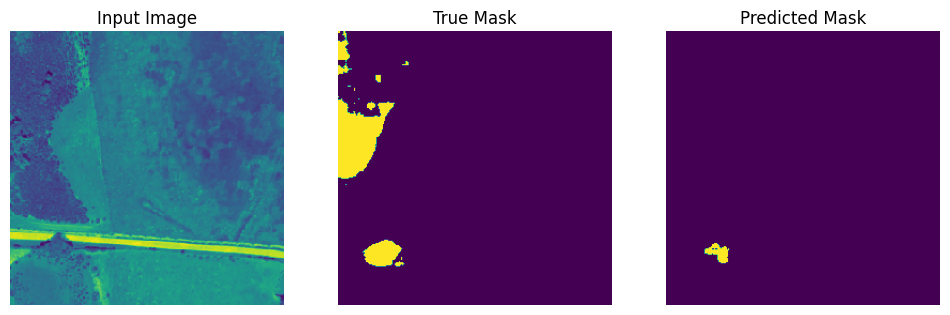


Sample Prediction after epoch 11

148/148 [==============================] - 483s 3s/step - loss: 0.0329 - binary_accuracy: 0.9466 - io_u: 0.8303 - val_loss: 0.0358 - val_binary_accuracy: 0.9454 - val_io_u: 0.8159 - lr: 4.6082e-05
learning rate : 2.2460520995082334e-05
Epoch 12/20
1/1 [==============================] - 1s 770ms/step loss: 0.0322 - binary_accuracy: 0.9472 - io_u: 0.83


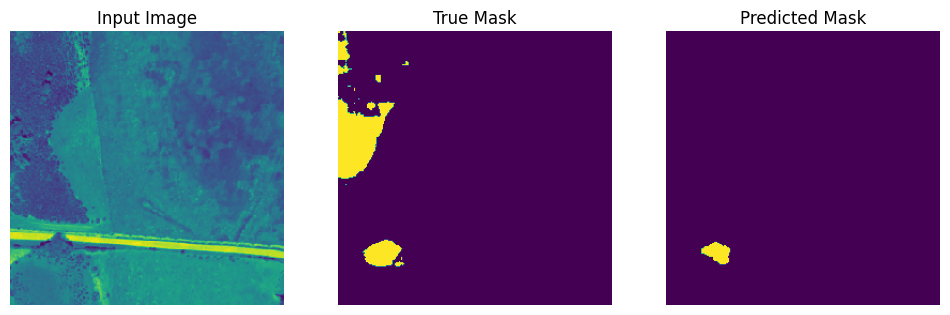


Sample Prediction after epoch 12

148/148 [==============================] - 481s 3s/step - loss: 0.0322 - binary_accuracy: 0.9472 - io_u: 0.8319 - val_loss: 0.0354 - val_binary_accuracy: 0.9454 - val_io_u: 0.8193 - lr: 2.2461e-05
learning rate : 9.846317880146671e-06
Epoch 13/20
1/1 [==============================] - 1s 787ms/step loss: 0.0319 - binary_accuracy: 0.9474 - io_u: 0.83


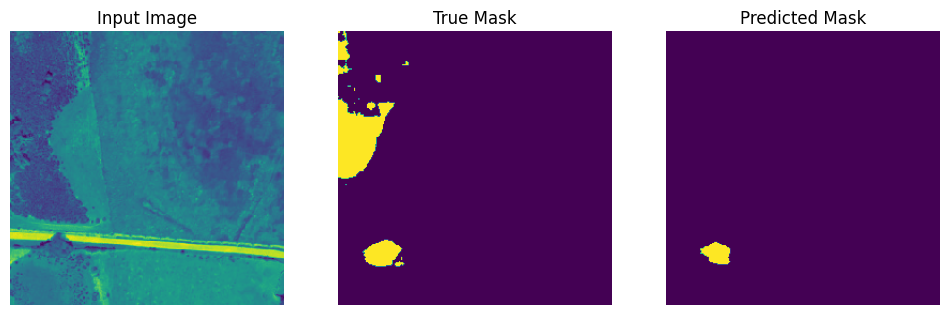


Sample Prediction after epoch 13


            Model checkpoint saved at epoch 13.
            
148/148 [==============================] - 482s 3s/step - loss: 0.0319 - binary_accuracy: 0.9474 - io_u: 0.8336 - val_loss: 0.0353 - val_binary_accuracy: 0.9463 - val_io_u: 0.8189 - lr: 9.8463e-06
learning rate : 3.827675300271949e-06
Epoch 14/20
1/1 [==============================] - 1s 738ms/step loss: 0.0317 - binary_accuracy: 0.9480 - io_u: 0.83


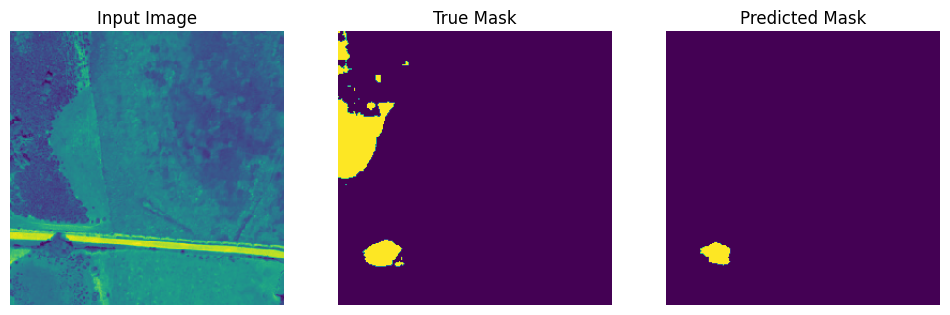


Sample Prediction after epoch 14

148/148 [==============================] - 489s 3s/step - loss: 0.0317 - binary_accuracy: 0.9480 - io_u: 0.8340 - val_loss: 0.0353 - val_binary_accuracy: 0.9467 - val_io_u: 0.8191 - lr: 3.8277e-06
learning rate : 1.2952222050444107e-06
Epoch 15/20
1/1 [==============================] - 1s 781ms/step loss: 0.0317 - binary_accuracy: 0.9478 - io_u: 0.83


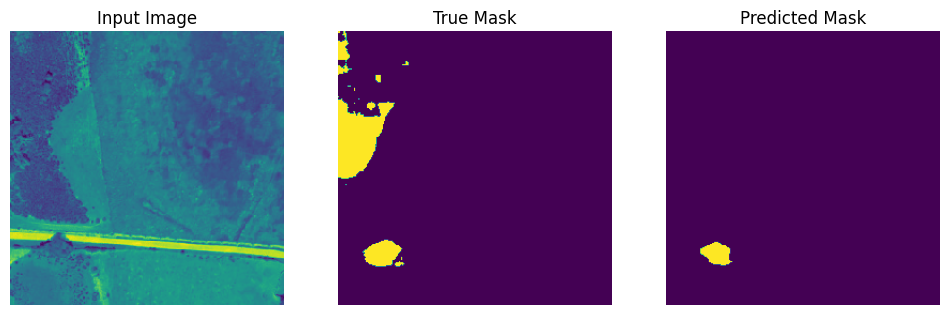


Sample Prediction after epoch 15

148/148 [==============================] - 494s 3s/step - loss: 0.0317 - binary_accuracy: 0.9478 - io_u: 0.8344 - val_loss: 0.0352 - val_binary_accuracy: 0.9468 - val_io_u: 0.8194 - lr: 1.2952e-06
learning rate : 3.719549397374067e-07
Epoch 16/20
1/1 [==============================] - 1s 766ms/step loss: 0.0316 - binary_accuracy: 0.9479 - io_u: 0.83


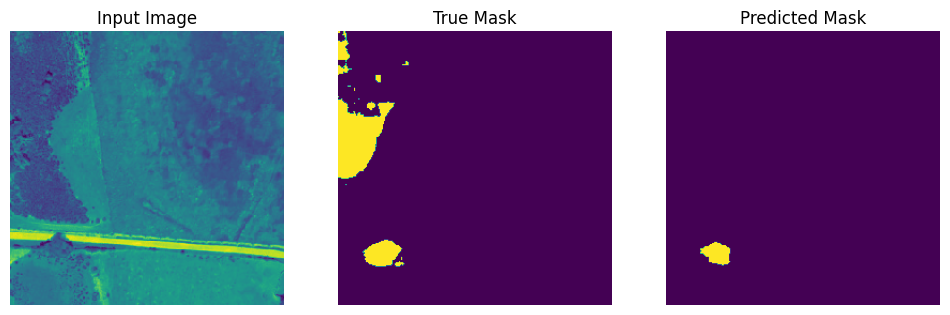


Sample Prediction after epoch 16

148/148 [==============================] - 505s 3s/step - loss: 0.0316 - binary_accuracy: 0.9479 - io_u: 0.8344 - val_loss: 0.0353 - val_binary_accuracy: 0.9470 - val_io_u: 0.8191 - lr: 3.7195e-07
learning rate : 8.738106771488674e-08
Epoch 17/20
1/1 [==============================] - 1s 763ms/step loss: 0.0316 - binary_accuracy: 0.9479 - io_u: 0.83


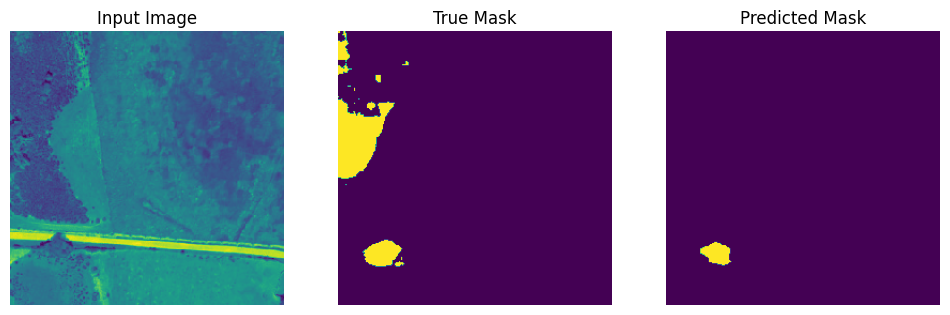


Sample Prediction after epoch 17

148/148 [==============================] - 479s 3s/step - loss: 0.0316 - binary_accuracy: 0.9479 - io_u: 0.8345 - val_loss: 0.0353 - val_binary_accuracy: 0.9465 - val_io_u: 0.8193 - lr: 8.7381e-08
learning rate : 1.584526643227946e-08
Epoch 18/20
1/1 [==============================] - 1s 786ms/step loss: 0.0316 - binary_accuracy: 0.9479 - io_u: 0.83


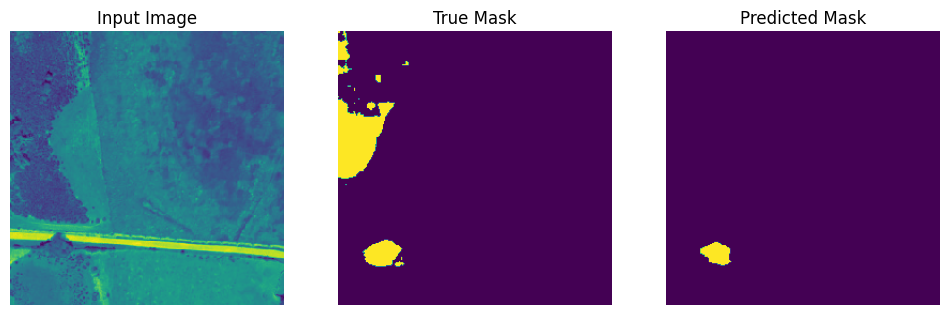


Sample Prediction after epoch 18

148/148 [==============================] - 481s 3s/step - loss: 0.0316 - binary_accuracy: 0.9479 - io_u: 0.8345 - val_loss: 0.0353 - val_binary_accuracy: 0.9467 - val_io_u: 0.8193 - lr: 1.5845e-08
learning rate : 1.9948009910564224e-09
Epoch 19/20
1/1 [==============================] - 1s 753ms/step loss: 0.0316 - binary_accuracy: 0.9479 - io_u: 0.83


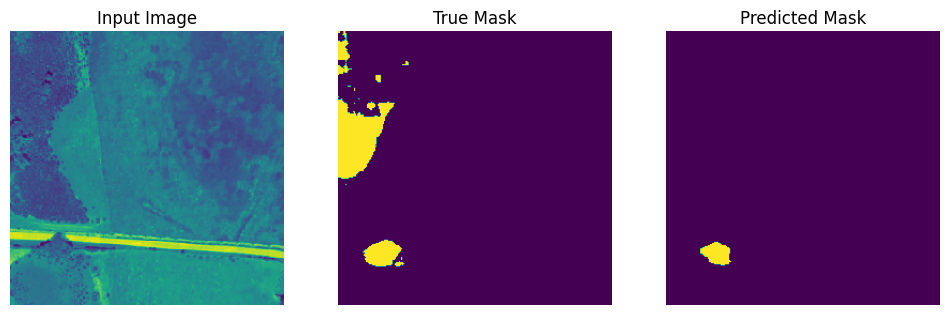


Sample Prediction after epoch 19

148/148 [==============================] - 486s 3s/step - loss: 0.0316 - binary_accuracy: 0.9479 - io_u: 0.8345 - val_loss: 0.0353 - val_binary_accuracy: 0.9466 - val_io_u: 0.8193 - lr: 1.9948e-09
learning rate : 1.345775574312924e-10
Epoch 20/20
1/1 [==============================] - 1s 788ms/step loss: 0.0316 - binary_accuracy: 0.9479 - io_u: 0.83


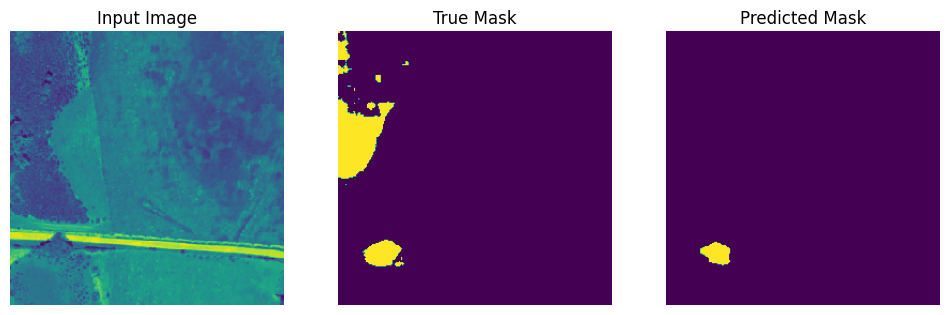


Sample Prediction after epoch 20


            Model checkpoint saved at epoch 20.
            
148/148 [==============================] - 483s 3s/step - loss: 0.0316 - binary_accuracy: 0.9479 - io_u: 0.8345 - val_loss: 0.0353 - val_binary_accuracy: 0.9467 - val_io_u: 0.8192 - lr: 1.3458e-10


In [255]:
callbacks = [
    PerformancePlotCallback(val_gen, batch=1),
    keras.callbacks.LearningRateScheduler(custom_LearningRate_schedular),
    keras.callbacks.EarlyStopping(patience=5, start_from_epoch=5),
    SaveCheckpointAtEpoch(config['models_dir']+f"35_14_61_49/{year}/{now}/", 
                          f"step_3_checkpoint_AttentionUnet_{int(len(train_input_img_paths))}" + \
                          f"_trains_9_10_2020_1_10_1993_img_2020_2001_masks_STplusplus_" + \
                          f"{shrinking_mode}_shrinked_{shrinking_structure_size}_" +
                          f"{epochnum}_epochs_schedular_epoch1" \
                          .replace('.', '_').replace('-','_') + ".h5",
                          [epochnum//3, epochnum*2//3, epochnum]),
    keras.callbacks.ModelCheckpoint(config['models_dir']+f"35_14_61_49/{year}/{now}/step_3_best_intermediary_AttentionUnet_{int(len(train_input_img_paths))}_trains_9_10_2020_1_10_1993_img_2020_2001_masks_STplusplus_{shrinking_mode}_shrinked_{shrinking_structure_size}_{epochnum}_epochs_schedular".replace('.', '_').replace('-','_') + ".h5", save_best_only=True)
]

LR = 1e-3
model_etape_3.compile(optimizer=keras.optimizers.Adam(learning_rate=LR), loss=losses.focal_tversky, metrics=[keras.metrics.BinaryAccuracy(), keras.metrics.IoU(num_classes=2, target_class_ids=[1])])

hist = model_etape_3.fit(train_gen_etape_3, epochs=epochnum, validation_data=val_gen_etape_3, callbacks=callbacks)

In [256]:
val_preds_etape_3 = model_etape_3.predict(val_gen_etape_3)

16/16 [==============================] - 13s 766ms/step


In [257]:
idx = random.randint(0, batch_size-1)
print(idx)
# batch = random.randint(0, len(val_gen)-1)

29


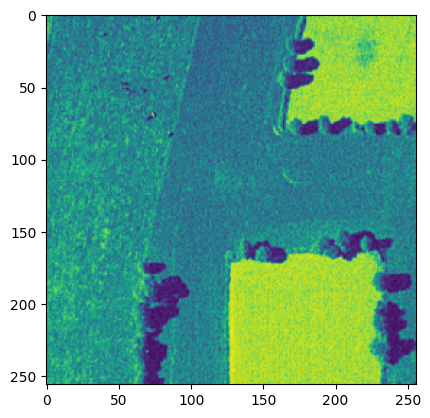

In [258]:
# ax, _ = plt.subplots(figsize=(6, 6))
plt.imshow(val_gen_etape_3.__getitem__(0)[0][idx])

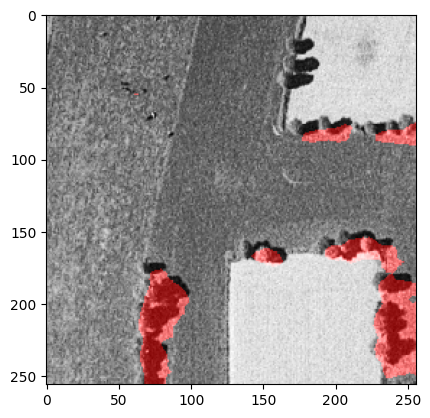

In [259]:
# ax, _ = plt.subplots(figsize=(6, 6))
fig = overlay_masks(val_gen_etape_3.__getitem__(0)[0][idx], np.round(val_preds_etape_3[idx]), colors=[(1, 0, 0)])
plt.imshow(fig)